# Installs & Imports

In [ ]:
# Standard libraries
import os
import math
import numpy as np
import pandas as pd
from datetime import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import json

# TensorFlow & Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import (
    layers, models, callbacks, optimizers, metrics
)

# Random seed
SEED = 1234
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Loading the Data

This image classification task will utilize the CIFAR-10 dataset, a commonly used benchmark dataset in the field of computer vision. There are 60,000 32x32 color images. The images are divided into 10 different classes. The Keras API allows us to load the dataset with 50,000 images assigned to the training set and 10,000 images assigned to the test set.

In [ ]:
# Load the CIFAR-10 dataset from Keras
cifar = keras.datasets.cifar10
(X_train, y_train), (X_test, y_test) = cifar.load_data()

170498071/170498071 [==============================] - 14s 0us/step


# Exploring the Data

In [ ]:
# Examine dataset shapes
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_train shape: (50000, 32, 32, 3)
y_train shape: (50000, 1)
X_test shape: (10000, 32, 32, 3)
y_test shape: (10000, 1)


In [ ]:
# Examine the data types
print(f'Type of X_train: {type(X_train)}')
print(f'Data type of elements in X_train: {X_train.dtype}\n')

print(f'Type of y_train: {type(y_train)}')
print(f'Data type of elements in y_train: {y_train.dtype}\n')

print(f'Type of X_test: {type(X_test)}')
print(f'Data type of elements in X_test: {X_test.dtype}\n')

print(f'Type of y_test: {type(y_test)}')
print(f'Data type of elements in y_test: {y_test.dtype}')

Type of X_train: <class 'numpy.ndarray'>
Data type of elements in X_train: uint8

Type of y_train: <class 'numpy.ndarray'>
Data type of elements in y_train: uint8

Type of X_test: <class 'numpy.ndarray'>
Data type of elements in X_test: uint8

Type of y_test: <class 'numpy.ndarray'>
Data type of elements in y_test: uint8


Let's take a look at some of the images from the dataset.

In [ ]:
# Create list of class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

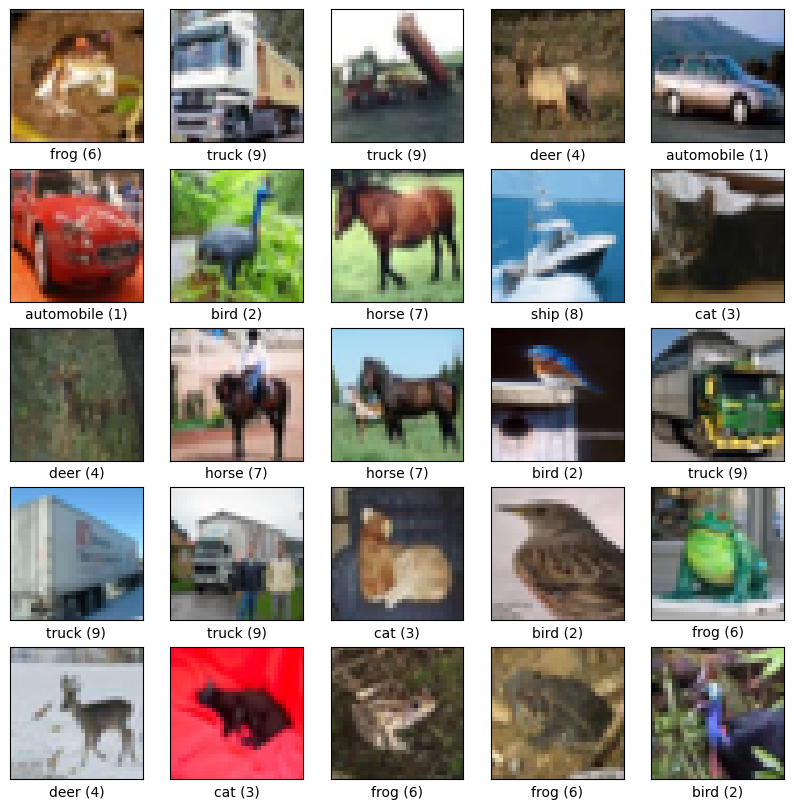

In [ ]:
# Function to plot image samples
def plot_images(X, y, nrows=5, ncols=5, class_names=class_names):
    plt.figure(figsize=(10, 10))
    for i in range(nrows * ncols):
        plt.subplot(nrows, ncols, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(X[i], cmap=plt.cm.binary)

        # Extract the label index as an integer
        label_index = y[i][0]
        label = class_names[label_index]

        # Display both label name and index
        plt.xlabel(f'{label} ({label_index})')
    plt.show()

# Call the function
plot_images(X_train, y_train)

As we can see, there are different images of both animals and modes of transportation in the dataset. Let's check out the class distribution.

In [ ]:
# Function to plot class distribution
def plot_class_distribution(y, title, color):
    class_counts = pd.DataFrame(y).value_counts()
    class_counts.plot(kind='bar', color=color)
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.title(title)
    plt.xticks(rotation=0, ticks=range(10), labels=range(10))
    plt.show()

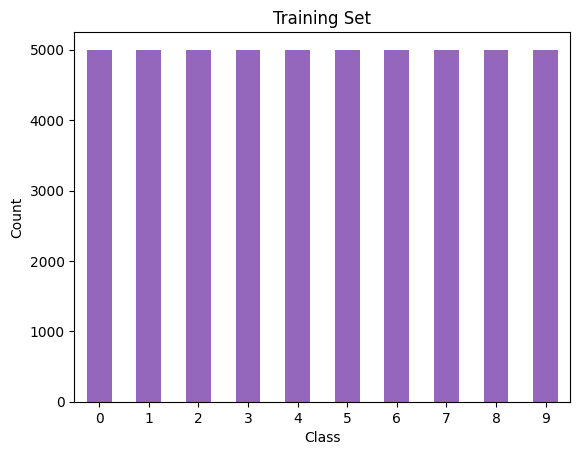

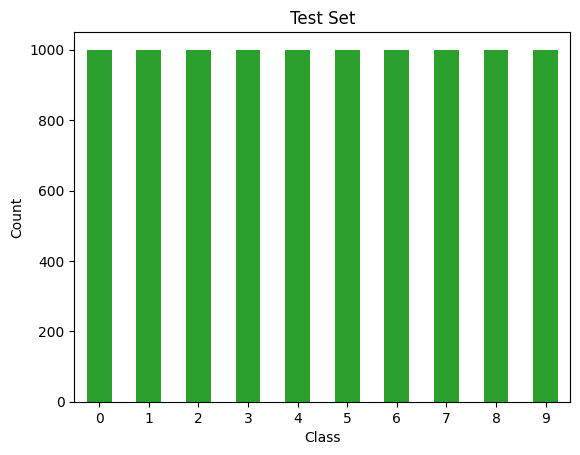

In [ ]:
# Call the function for each label set
plot_class_distribution(y_train, 'Training Set', sns.color_palette()[4])
plot_class_distribution(y_test, 'Test Set', sns.color_palette()[2])

We have 5,000 observations for each class in the training set and 1,000 for each class in the test set. Of course, we knew beforehand that this benchmark dataset was perfectly balanced, but it is always good to inspect for oneself. Next, we can examine the RGB distribution amongst the classes. Do some classes exhibit more dominance, on average, with respect to a particular channel?

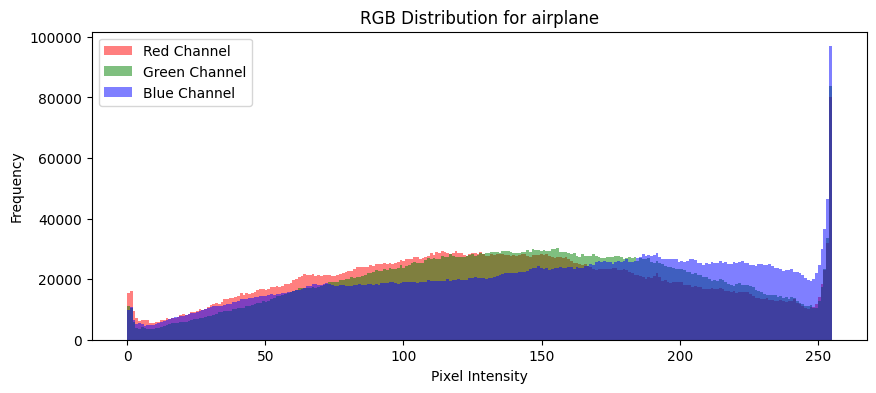

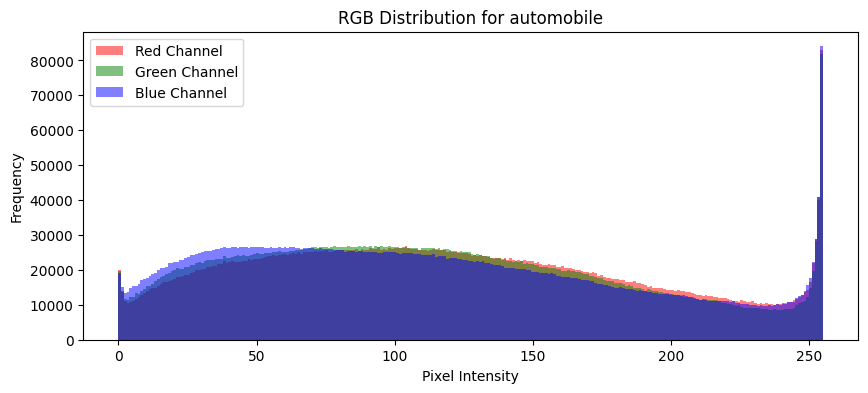

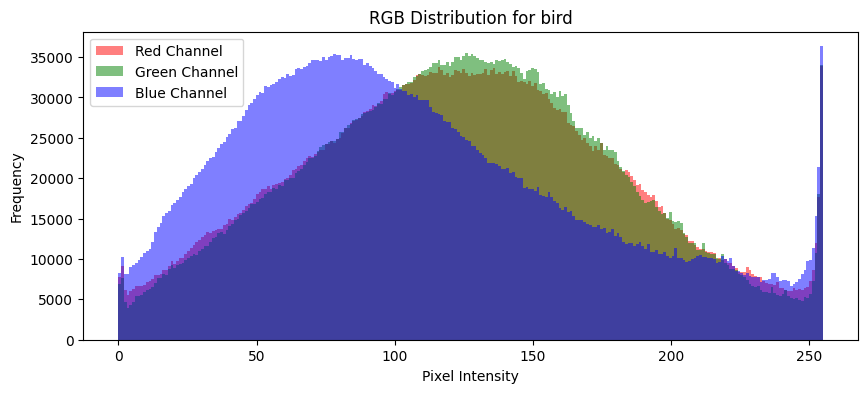

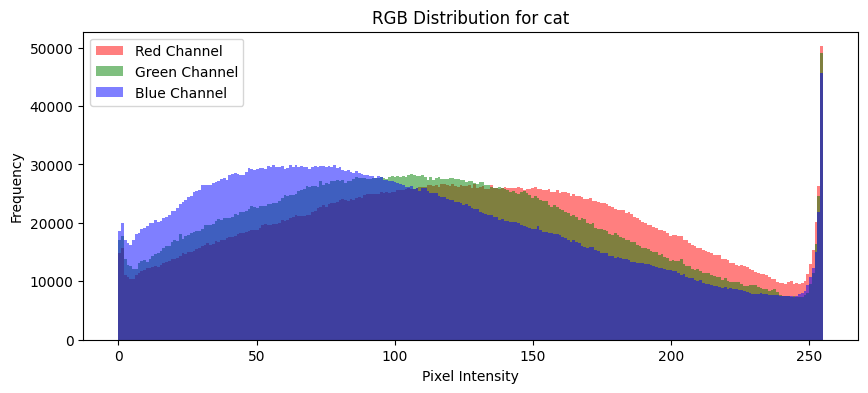

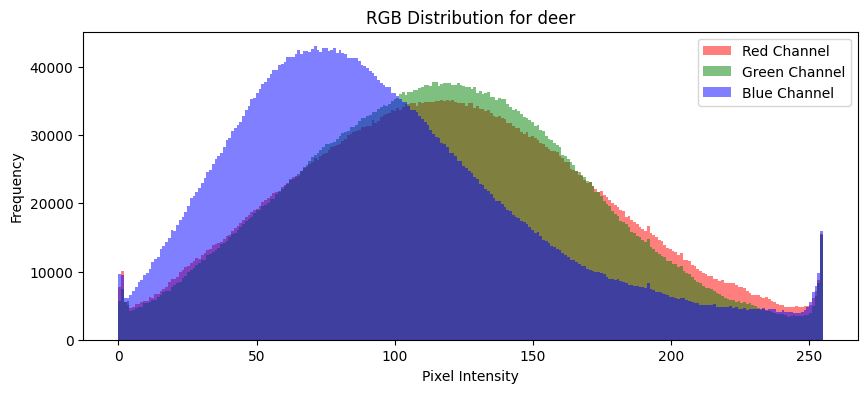

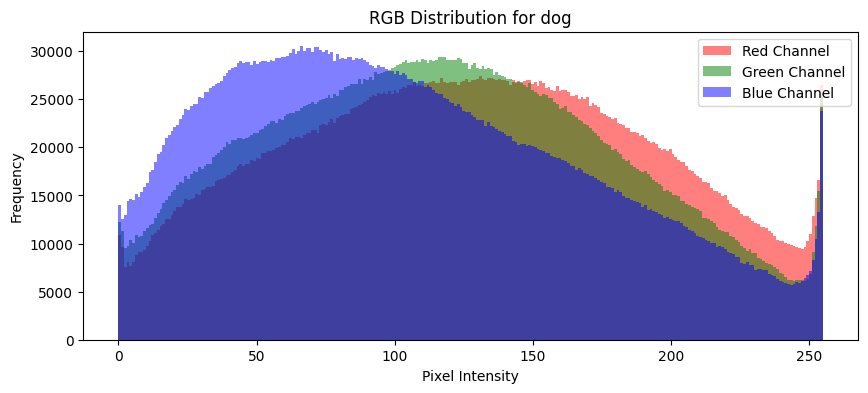

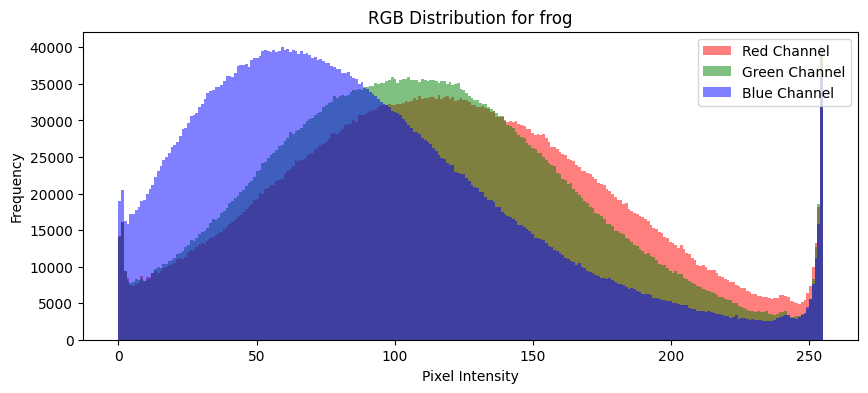

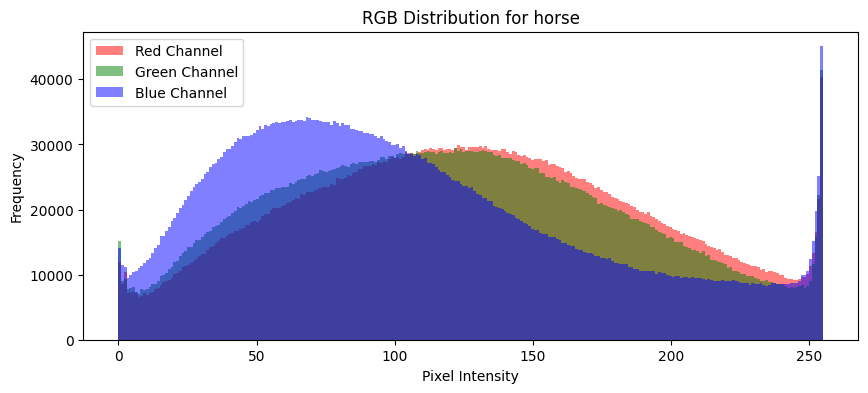

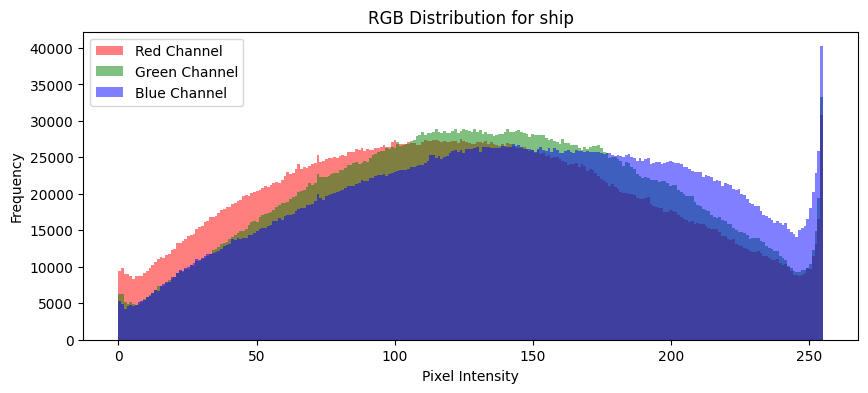

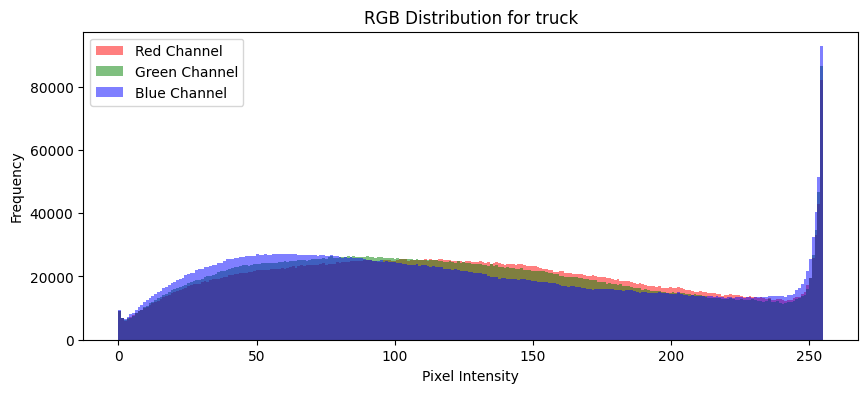

In [ ]:
# Function to plot RGB distribution for a class
def plot_rgb_distribution(class_idx, class_name):
    # Filter images for a specific class
    images = X_train[y_train.flatten() == class_idx]

    # Initialize lists to store RGB values
    red_values, green_values, blue_values = [], [], []

    # Extract RGB values
    for img in images:
        red_values.append(img[:, :, 0].flatten())
        green_values.append(img[:, :, 1].flatten())
        blue_values.append(img[:, :, 2].flatten())

    # Convert lists to numpy arrays
    red_values = np.concatenate(red_values)
    green_values = np.concatenate(green_values)
    blue_values = np.concatenate(blue_values)

    # Plotting
    plt.figure(figsize=(10, 4))
    plt.hist(red_values, bins=256, color='red', alpha=0.5, label='Red Channel')
    plt.hist(green_values, bins=256, color='green', alpha=0.5, label='Green Channel')
    plt.hist(blue_values, bins=256, color='blue', alpha=0.5, label='Blue Channel')
    plt.title(f'RGB Distribution for {class_name}')
    plt.legend()
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()

# Call the function
for cls in class_names:
    plot_rgb_distribution(class_names.index(cls), cls)

As expected, the transportation-related images exhibit lower pixel intensity values across the RGB channels, as these are typically less colorful than the animal images. The RGB distributions for animals tend to have a high frequency of low intensity pixel values in the blue channel. The ship images have high intensity in the blue channel; probably because the images contain bodies of water or the sky in the background, which can have a brighter quality to them.

# Splitting the Data

Next, we will create a validation dataset from the training dataset. Let's make sure to maintain the balance among classes for the split training and validation sets.

In [ ]:
# Set random seed
np.random.seed(SEED)

# Number of validation samples
VAL_SIZE = 10000

# Initialize lists to hold stratified splits
X_train_strat = []
y_train_strat = []
X_val_strat = []
y_val_strat = []

# Get unique classes and counts
classes, counts = np.unique(y_train, return_counts=True)

# Calculate number of val samples for each class
val_counts = (counts / len(y_train)) * VAL_SIZE

# Loop to split the data
for cls, val_count in zip(classes, val_counts):
    # Get indices of all samples in current class
    cls_indices = np.where(y_train == cls)[0]

    # Shuffle indices
    np.random.shuffle(cls_indices)

    # Calculate split index
    split_idx = int(len(cls_indices) - val_count)

    # Split the data for the class
    X_train_cls = X_train[cls_indices[:split_idx]]
    y_train_cls = y_train[cls_indices[:split_idx]]
    X_val_cls = X_train[cls_indices[split_idx:]]
    y_val_cls = y_train[cls_indices[split_idx:]]

    # Append to the lists
    X_train_strat.extend(X_train_cls)
    y_train_strat.extend(y_train_cls)
    X_val_strat.extend(X_val_cls)
    y_val_strat.extend(y_val_cls)

# Convert lists back to arrays
X_train = np.array(X_train_strat)
y_train = np.array(y_train_strat)
X_val = np.array(X_val_strat)
y_val = np.array(y_val_strat)

In [ ]:
# Dataset shapes
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}\n')
print(f'X_val shape: {X_val.shape}')
print(f'y_val shape: {y_val.shape}\n')
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_train shape: (40000, 32, 32, 3)
y_train shape: (40000, 1)

X_val shape: (10000, 32, 32, 3)
y_val shape: (10000, 1)

X_test shape: (10000, 32, 32, 3)
y_test shape: (10000, 1)


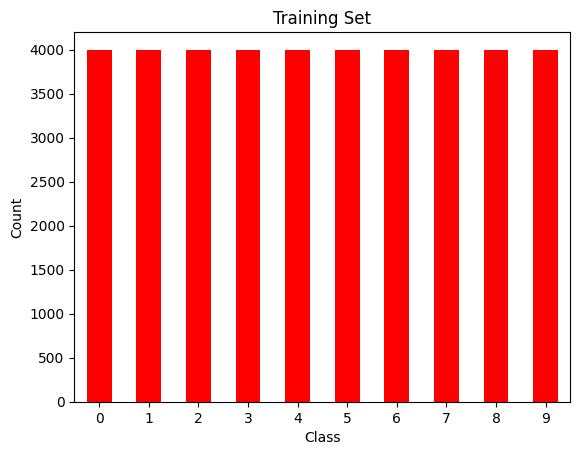

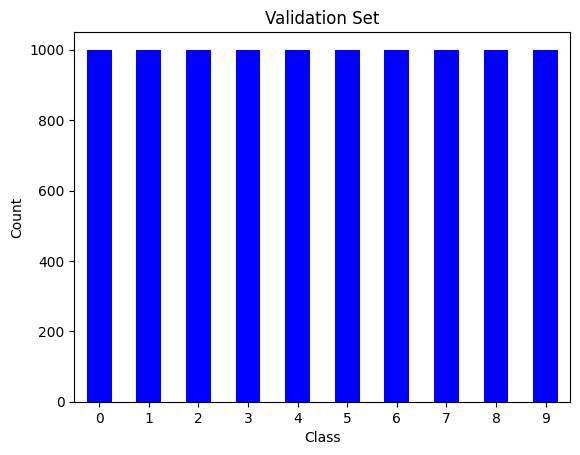

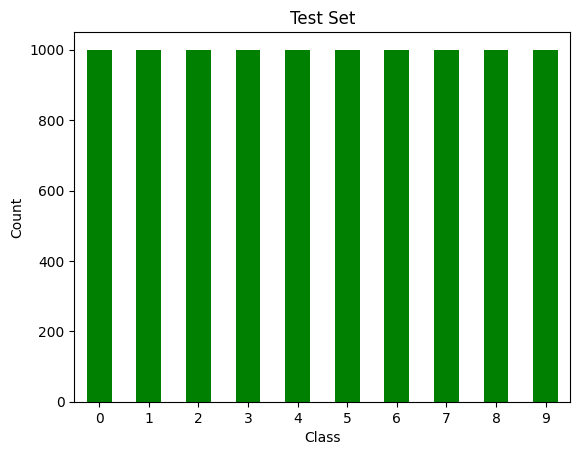

In [ ]:
# Check distributions
plot_class_distribution(y_train, 'Training Set', 'red')
plot_class_distribution(y_val, 'Validation Set', 'blue')
plot_class_distribution(y_test, 'Test Set', 'green')

Great, now we have 1,000 samples for each class in our newly created validation set.

# Normalizing the Data

After splitting, we need to normalize our image data.

In [ ]:
# Normalize the data
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

# Converting to Tensors

We will convert the data to tensors and create batched TensorFlow datasets to take advantage of GPU usage and optimize the training process.

In [ ]:
# Convert the arrays into tensors
X_train = tf.convert_to_tensor(X_train, dtype=tf.float32)
X_val = tf.convert_to_tensor(X_val, dtype=tf.float32)
X_test = tf.convert_to_tensor(X_test, dtype=tf.float32)

y_train = tf.convert_to_tensor(y_train, dtype=tf.int32)
y_val = tf.convert_to_tensor(y_val, dtype=tf.int32)
y_test = tf.convert_to_tensor(y_test, dtype=tf.int32)

# Creating TF Datasets

In [ ]:
# Create TensorFlow datasets
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

In [ ]:
# Define batch size
BATCH_SIZE = 32

# Create batches
train_dataset = train_dataset.shuffle(len(X_train)).batch(BATCH_SIZE)
val_dataset = val_dataset.batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

# Cache and prefetch
train_dataset = train_dataset.cache().prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.cache().prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.cache().prefetch(tf.data.AUTOTUNE)

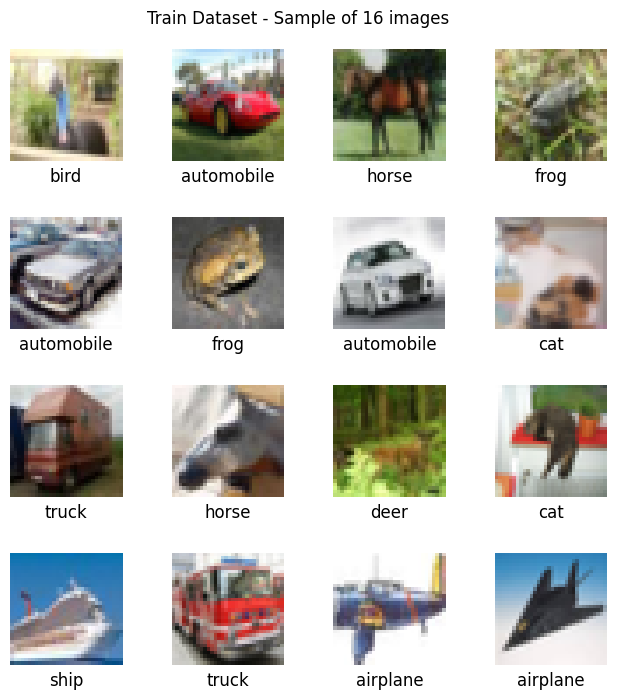

In [ ]:
# Function to display batch of images
def show_batch(dataset, dataset_name, num_images=16, rows=4):
    for images, labels in dataset.take(1):
        num_columns = num_images // rows
        plt.figure(figsize=(num_columns * 2, rows * 2))
        plt.subplots_adjust(hspace=0.5)
        for i in range(num_images):
            ax = plt.subplot(rows, num_columns, i + 1)
            plt.imshow(images[i].numpy())
            ax.set_title(class_names[labels[i].numpy()[0]], y=-0.25)
            plt.axis('off')
        plt.suptitle(f'{dataset_name} - Sample of {num_images} images', y=0.93)
        plt.show()

# Call the function
show_batch(train_dataset, 'Train Dataset', num_images=16, rows=4)

In [ ]:
# Examine batch shapes
for images, labels in train_dataset.take(1):
    print(f'Train Images Shape: {images.shape}')
    print(f'Train Labels Shape: {labels.shape}\n')

for images, labels in val_dataset.take(1):
    print(f'Val Images Shape: {images.shape}')
    print(f'Val Labels Shape: {labels.shape}\n')

for images, labels in test_dataset.take(1):
    print(f'Test Images Shape: {images.shape}')
    print(f'Test Labels Shape: {labels.shape}')

Train Images Shape: (32, 32, 32, 3)
Train Labels Shape: (32, 1)

Val Images Shape: (32, 32, 32, 3)
Val Labels Shape: (32, 1)

Test Images Shape: (32, 32, 32, 3)
Test Labels Shape: (32, 1)


# Building the Models

For this task we will create a basic convolutional neural network. This type of neural network consists of a set of filters or kernels that slide across the input image in a process known as convolution. The filters selectively respond to patterns in the images such as edges, textures, and shapes. The convolution process produces learned feature maps that can be fed into additional filters, which can learn even more complex feature maps corresponding to specific features within an image. For example, in a deeper convolutional layer, the network may learn mathematical representations for hands, eyes, or other body parts. Pooling layers follow the convolutional filters to reduce the dimensionality of the feature maps. Max pooling is a common type of pooling operation that takes the maximum value in a patch of the feature map, thereby preserving the most important features for subsequent layers. Batch normalization can enhance training stability during backpropagation, dropout can help to mitigate overfitting, and residual connections can enable deeper architectures and prevent vanishing gradients. Let's create an implementation with Keras.

## Simple CNN

In [ ]:
# Define the model architecture
def build_simple_cnn(input_shape, num_classes):
    model = models.Sequential()

    # First convolutional layer
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))

    # Second convolutional layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Third convolutional layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))

    # Flatten the output and add dense layers
    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 15, 15, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 64)          36928     
                                                                 
 flatten (Flatten)           (None, 1024)              0

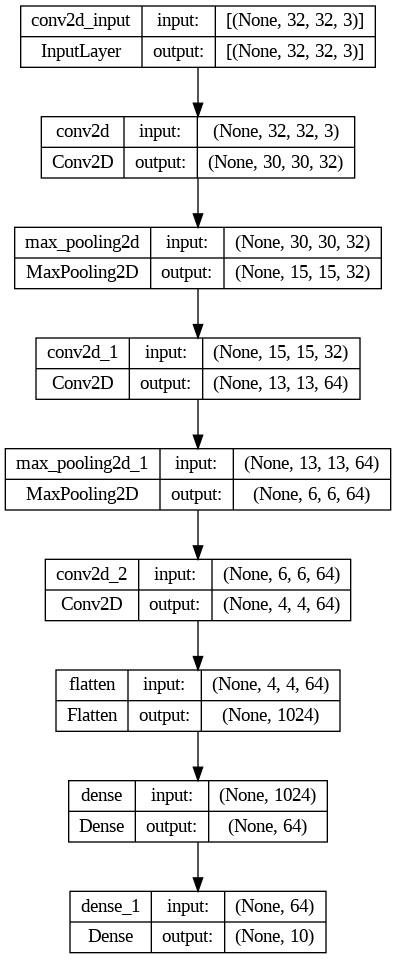

In [ ]:
# Number of classes and input shape
num_classes = len(class_names)
input_shape = X_train.shape[1:]

# Build the model
simple_model = build_simple_cnn(input_shape=input_shape, num_classes=num_classes)

# Compile the model
simple_model.compile(optimizer='adam',
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy']
)

# Model summary
simple_model.summary()

# Plot the model
keras.utils.plot_model(simple_model, show_shapes=True)

Alright, we have our simpler implementation created. Let's also create an implementation with more "bells and whistles" such as dropout, normalization, and residual connections.

## Deeper CNN

In [ ]:
# Residual block function
def residual_block(x, filters, kernel_size=(3, 3), padding='same', strides=1,
        use_dropout=False, dropout_rate=0.2):
    shortcut = x
    # Adjust shortcut connection if stride is not 1
    if strides != 1 or x.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, kernel_size=(1, 1),
                                 strides=strides, padding=padding,
                                 kernel_initializer='he_normal')(shortcut)
        shortcut = layers.BatchNormalization()(shortcut)

    # First convolutional layer
    x = layers.Conv2D(filters, kernel_size, strides=strides, padding=padding,
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    if use_dropout:
        x = layers.Dropout(dropout_rate)(x)

    # Second convolutional layer
    x = layers.Conv2D(filters, kernel_size, padding=padding,
                      kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)

    # Add the shortcut
    x = layers.Add()([shortcut, x])
    x = layers.Activation('relu')(x)

    return x

In [ ]:
# Model-building function
def build_deeper_model(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (3, 3), padding='same',
                      kernel_initializer='he_normal')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # First 2-convolution + residual block
    x = residual_block(x, 64, use_dropout=True)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)

    # Second 2-convolution + residual block
    x = residual_block(x, 128, use_dropout=True)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)

    # Third 2-convolution + residual block
    x = residual_block(x, 256, use_dropout=True)

    # Flatten with global average pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Add dense layers
    x = layers.Dense(256, activation='relu')(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv2d_3 (Conv2D)           (None, 32, 32, 64)           1792      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 32, 32, 64)           256       ['conv2d_3[0][0]']            
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 32, 32, 64)           0         ['batch_normalization[0][0

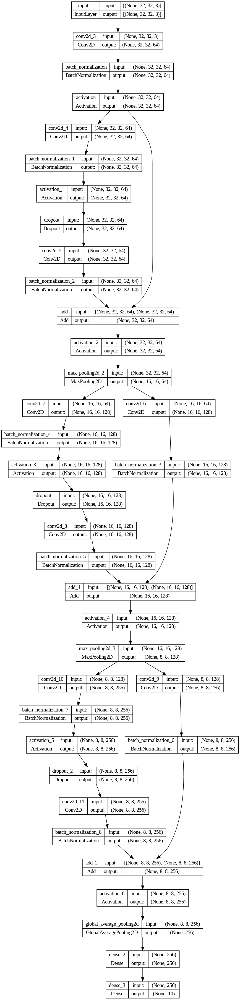

In [ ]:
# Build the model
deeper_model = build_deeper_model(input_shape=input_shape, num_classes=num_classes)

# Compile the model
deeper_model.compile(optimizer='adam',
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy']
)

# Model summary
deeper_model.summary()

# Plot model
keras.utils.plot_model(deeper_model, show_shapes=True)

# Training the Models

Now we will train both models and compare their performances.

In [ ]:
# Set epochs
EPOCHS = 100

## Callbacks

In [ ]:
# Function to create callbacks
def create_callbacks(model_name):
    # Model checkpoint
    checkpoint_dir = f'./model_checkpoints/{model_name}'
    os.makedirs(checkpoint_dir, exist_ok=True)

    checkpoint_cb = callbacks.ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, 'best_model.tf'),
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,
        verbose=1
    )

    # Early stopping
    early_stopping_cb = callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    )

    # Reduce LR on plateau
    reduce_lr_cb = callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.1,
        patience=3,
        verbose=1,
        min_delta=1e-2,
        mode='min'
    )

    # TensorBoard
    log_dir = os.path.join('./logs', model_name, dt.now().strftime("%Y%m%d-%H%M%S"))
    os.makedirs(log_dir, exist_ok=True)

    tensorboard_cb = callbacks.TensorBoard(
        log_dir=log_dir,
        histogram_freq=1,
        update_freq='epoch',
        profile_batch=0,
        write_graph=True
    )

    return [checkpoint_cb, early_stopping_cb, reduce_lr_cb, tensorboard_cb]

## History Plotting Function

In [ ]:
# Function to plot all of the metrics
def plot_history(history):
    plt.figure(figsize=(15, 10))

    # Plot training and validation loss
    plt.subplot(2, 1, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot training and validation accuracy
    plt.subplot(2, 1, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

## Simple CNN

In [ ]:
# Fit the model
simple_history = simple_model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=create_callbacks('simple_cnn'),
    verbose=1
)

Epoch 1/100
1238/1250 [============================>.] - ETA: 0s - loss: 1.5562 - accuracy: 0.4301
Epoch 1: val_loss improved from inf to 1.31884, saving model to ./model_checkpoints/simple_cnn/best_model.tf
1250/1250 [==============================] - 11s 5ms/step - loss: 1.5542 - accuracy: 0.4306 - val_loss: 1.3188 - val_accuracy: 0.5238 - lr: 0.0010
Epoch 2/100
1250/1250 [==============================] - ETA: 0s - loss: 1.1970 - accuracy: 0.5768
Epoch 2: val_loss improved from 1.31884 to 1.15827, saving model to ./model_checkpoints/simple_cnn/best_model.tf
1250/1250 [==============================] - 6s 5ms/step - loss: 1.1970 - accuracy: 0.5768 - val_loss: 1.1583 - val_accuracy: 0.5877 - lr: 0.0010
Epoch 3/100
1239/1250 [============================>.] - ETA: 0s - loss: 1.0445 - accuracy: 0.6337
Epoch 3: val_loss improved from 1.15827 to 1.11765, saving model to ./model_checkpoints/simple_cnn/best_model.tf
1250/1250 [==============================] - 6s 5ms/step - loss: 1.0439 - a

## Deeper CNN

In [ ]:
# Fit the model
deeper_history = deeper_model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=create_callbacks('deeper_cnn'),
    verbose=1
)

Epoch 1/100
1249/1250 [============================>.] - ETA: 0s - loss: 1.2853 - accuracy: 0.5293
Epoch 1: val_loss improved from inf to 1.21102, saving model to ./model_checkpoints/deeper_cnn/best_model.tf
1250/1250 [==============================] - 35s 22ms/step - loss: 1.2852 - accuracy: 0.5293 - val_loss: 1.2110 - val_accuracy: 0.5898 - lr: 0.0010
Epoch 2/100
1250/1250 [==============================] - ETA: 0s - loss: 0.8689 - accuracy: 0.6909
Epoch 2: val_loss improved from 1.21102 to 0.93658, saving model to ./model_checkpoints/deeper_cnn/best_model.tf
1250/1250 [==============================] - 27s 21ms/step - loss: 0.8689 - accuracy: 0.6909 - val_loss: 0.9366 - val_accuracy: 0.6730 - lr: 0.0010
Epoch 3/100
1250/1250 [==============================] - ETA: 0s - loss: 0.6950 - accuracy: 0.7556
Epoch 3: val_loss did not improve from 0.93658
1250/1250 [==============================] - 23s 19ms/step - loss: 0.6950 - accuracy: 0.7556 - val_loss: 1.0821 - val_accuracy: 0.6616 - l

# Evaluating the Models

## Simple CNN

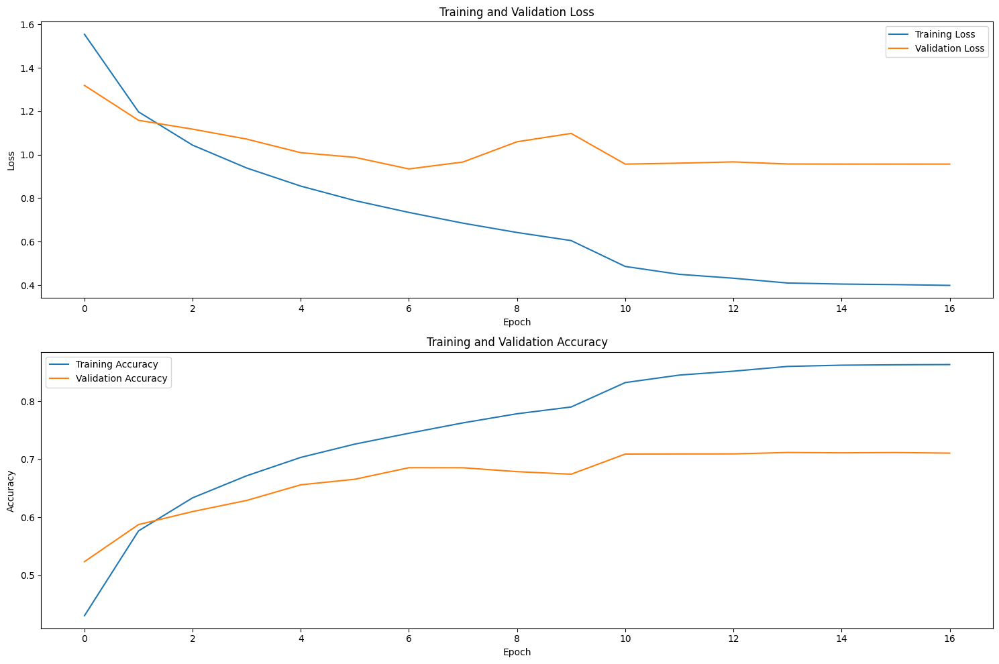

In [ ]:
# Visualize the training history
plot_history(simple_history)

The simple CNN model starts to overfit quickly and the validation metrics appear to plateau around 10 epochs.

In [ ]:
# Access TensorBoard
%load_ext tensorboard
%tensorboard --logdir=./logs/simple_cnn
#%reload_ext tensorboard

<IPython.core.display.Javascript object>

In [ ]:
# Load the best model
best_simple = models.load_model('./model_checkpoints/simple_cnn/best_model.tf')

In [ ]:
# Evaluate on the test set
loss_simple, accuracy_simple = best_simple.evaluate(test_dataset)
print(f'Test Loss: {loss_simple}, Test Accuracy: {accuracy_simple}')

313/313 [==============================] - 1s 2ms/step - loss: 0.9480 - accuracy: 0.6839
Test Loss: 0.9480394721031189, Test Accuracy: 0.683899998664856


The simple CNN achieved an accuracy score of 68.4%. Let's see if the deeper architecture leads to more favorable results.

## Deeper CNN

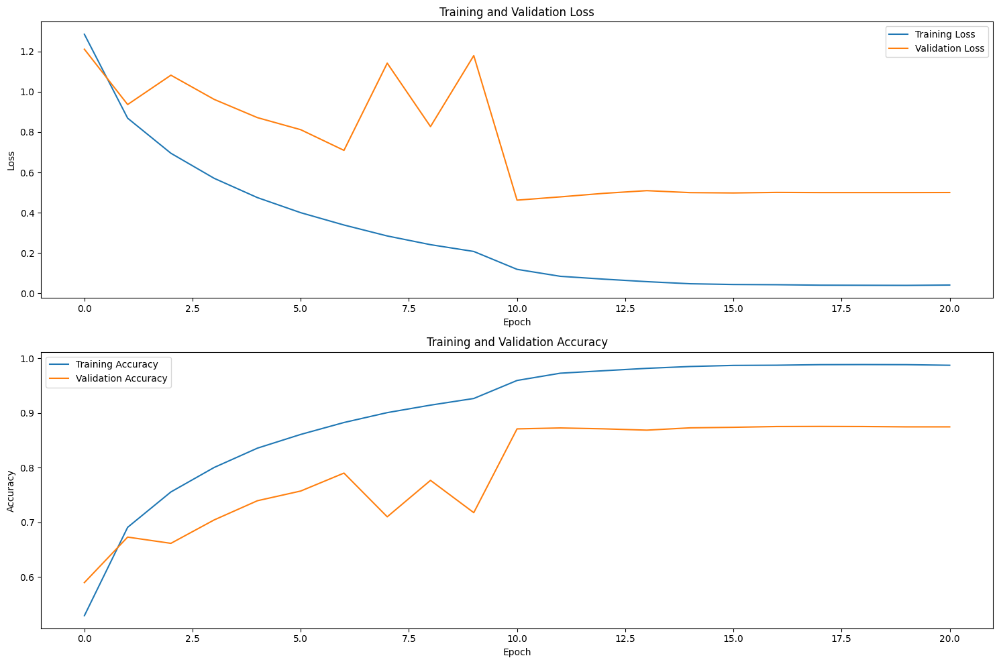

In [ ]:
# Visualize the training history
plot_history(deeper_history)

Again, overfitting appears to occur quite rapidly. The validation performance stalls at around 10 epochs.

In [ ]:
# Access TensorBoard
%load_ext tensorboard
%tensorboard --logdir=./logs/deeper_cnn
#%reload_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# Load the best model
best_deeper = models.load_model('./model_checkpoints/deeper_cnn/best_model.tf')

In [ ]:
# Evaluate on the test set
loss_deeper, accuracy_deeper = best_deeper.evaluate(test_dataset)
print(f'Test Loss: {loss_deeper}, Test Accuracy: {accuracy_deeper}')

313/313 [==============================] - 2s 6ms/step - loss: 0.4826 - accuracy: 0.8614
Test Loss: 0.48257148265838623, Test Accuracy: 0.8614000082015991


The deeper CNN model achieved an accuracy score of 86.1%. This is a performance increase of nearly 18% compared to the simple CNN model.

# Hyperparameter Tuning

The deeper architecture allowed for higher performance, but 86.1% is not that impressive. Let's see if tuning the many hyperparameters involved can give us a higher accuracy score.

## Model Redefinition

First, we will redefine the residual block and model as classes.

In [ ]:
# Number of classes and input shape
num_classes = len(class_names)
input_shape = X_train.shape[1:]

In [ ]:
# Residual block as a layer class
class ResidualBlock(layers.Layer):
    def __init__(
            self,
            filters,
            kernel_size=(3, 3),
            strides=1,
            use_dropout=False,
            dropout_rate=0.2,
            kernel_initializer='he_normal',
            **kwargs
    ):
        super(ResidualBlock, self).__init__(**kwargs)
        self.filters = filters
        self.kernel_size = kernel_size
        self.strides = strides
        self.use_dropout = use_dropout
        self.dropout_rate = dropout_rate
        self.kernel_initializer = kernel_initializer

    def build(self, input_shape):
        # First convolutional layer
        self.conv1a = layers.Conv2D(
            self.filters,
            kernel_size=(1, 1),
            strides=self.strides,
            padding='same',
            kernel_initializer=self.kernel_initializer
        )
        self.bn1a = layers.BatchNormalization()

        # Second convolutional layer
        self.conv1b = layers.Conv2D(
            self.filters,
            self.kernel_size,
            strides=self.strides,
            padding='same',
            kernel_initializer=self.kernel_initializer
        )
        self.bn1b = layers.BatchNormalization()
        self.act1 = layers.Activation('relu')
        self.dropout = layers.Dropout(self.dropout_rate)

        # Third convolutional layer
        self.conv2 = layers.Conv2D(
            self.filters,
            self.kernel_size,
            padding='same',
            kernel_initializer=self.kernel_initializer
        )
        self.bn2 = layers.BatchNormalization()
        self.add = layers.Add()
        self.act2 = layers.Activation('relu')

        super(ResidualBlock, self).build(input_shape)

    def call(self, inputs):
        # Create shortcut path
        shortcut = inputs
        if self.strides != 1 or inputs.shape[-1] != self.filters:
            shortcut = self.conv1a(shortcut)
            shortcut = self.bn1a(shortcut)

        # Main path
        x = self.conv1b(inputs)
        x = self.bn1b(x)
        x = self.act1(x)
        if self.use_dropout:
            x = self.dropout(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.add([shortcut, x])  # Combine
        x = self.act2(x)
        return x

    def get_config(self):
        config = super(ResidualBlock, self).get_config()
        config.update({
            'filters': self.filters,
            'kernel_size': self.kernel_size,
            'strides': self.strides,
            'use_dropout': self.use_dropout,
            'dropout_rate': self.dropout_rate,
            'kernel_initializer': self.kernel_initializer
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

In [ ]:
# Deep CNN model as a class
class DeepCNNModel(keras.Model):
    def __init__(
            self,
            input_shape,
            num_classes,
            n_blocks,
            filters,
            kernel_size,
            strides,
            activation,
            dropout_rate,
            kernel_initializer,
            dense_units
    ):
        super(DeepCNNModel, self).__init__()

        # Initialization parameters
        self.init_input_shape = input_shape
        self.init_num_classes = num_classes
        self.init_n_blocks = n_blocks
        self.init_filters = filters
        self.init_kernel_size = kernel_size
        self.init_strides = strides
        self.init_activation = activation
        self.init_dropout_rate = dropout_rate
        self.init_kernel_initializer = kernel_initializer
        self.init_dense_units = dense_units

        # Initial convolutional layer
        self.conv_initial = layers.Conv2D(
            filters[0],
            kernel_size,
            padding='same',
            kernel_initializer=kernel_initializer,
            input_shape=input_shape
        )
        self.batch_norm_initial = layers.BatchNormalization()
        self.activation_initial = layers.Activation(activation)

        # Construct residual blocks for each stage
        self.res_blocks = []
        for i, num_blocks in enumerate(n_blocks):
            stage_blocks = []
            for _ in range(num_blocks):
                stage_blocks.append(ResidualBlock(
                    filters=filters[i],
                    kernel_size=kernel_size,
                    strides=strides,
                    use_dropout=dropout_rate > 0,
                    dropout_rate=dropout_rate,
                    kernel_initializer=kernel_initializer)
            )
            self.res_blocks.append(stage_blocks)

            # Pooling layer between stages
            if i < len(n_blocks) - 1:
                self.res_blocks.append(
                    [layers.MaxPooling2D(pool_size=(2, 2))]
                )

        # Global Average Pooling and Dense layers
        self.global_pool = layers.GlobalAveragePooling2D()
        self.dense1 = layers.Dense(dense_units, activation=activation)
        self.dense2 = layers.Dense(num_classes, activation='softmax')

    def call(self, x):
        x = self.conv_initial(x)
        x = self.batch_norm_initial(x)
        x = self.activation_initial(x)

        # Apply all blocks in each stage
        for stage in self.res_blocks:
            for block in stage:
                x = block(x)

        x = self.global_pool(x)
        x = self.dense1(x)
        x = self.dense2(x)
        return x

    def get_config(self):
        config = super().get_config()
        config.update({
            'input_shape': self.init_input_shape,
            'num_classes': self.init_num_classes,
            'n_blocks': self.init_n_blocks,
            'filters': self.init_filters,
            'kernel_size': self.init_kernel_size,
            'strides': self.init_strides,
            'activation': self.init_activation,
            'dropout_rate': self.init_dropout_rate,
            'kernel_initializer': self.init_kernel_initializer,
            'dense_units': self.init_dense_units
        })
        return config

    def from_config(cls, config):
        return cls(**config)

## Optuna

Our first hyperparameter tuning approach will be utilizing the Optuna library. A Bayesian algorithm, the Tree-structured Parzen Estimator, will decide which set of hyperparameters to try next, based on the results of the past trial run.

In [ ]:
!pip install optuna -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 12.1 MB/s eta 0:00:00


In [ ]:
import optuna

# Define the objective function
def objective(trial):
    # Define the hyperparameters
    n_blocks_stage1 = trial.suggest_int('n_blocks_stage1', 1, 3)
    n_blocks_stage2 = trial.suggest_int('n_blocks_stage2', 1, 3)
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)
    activation = trial.suggest_categorical('activation',
     ['relu', 'leaky_relu', 'elu', 'selu']
    )
    dropout_rate = trial.suggest_float('dropout_rate', 0.0, 0.5)

    # Convert lists and tuples to strings for categorical choices
    filters_choice = trial.suggest_categorical('filters',
     ['64_128', '32_64', '128_256']
    )
    kernel_size_choice = trial.suggest_categorical('kernel_size',
     ['3_3', '5_5']
    )

    # Convert back to original types before using them
    filters = [int(f) for f in filters_choice.split('_')]
    kernel_size = tuple(map(int, kernel_size_choice.split('_')))

    strides = trial.suggest_categorical('strides', [1, 2])
    kernel_initializer = trial.suggest_categorical('kernel_initializer',
     ['he_normal', 'glorot_normal', 'lecun_normal', 'orthogonal']
    )
    dense_units = trial.suggest_int('dense_units', 32, 512)

    # Convert back to original types before using them
    filters = [int(f) for f in filters_choice.split('_')]
    kernel_size = tuple(map(int, kernel_size_choice.split('_')))

    # Build and compile the model
    model = DeepCNNModel(
        input_shape,
        num_classes,
         [n_blocks_stage1, n_blocks_stage2],
        filters,
        kernel_size,
        strides,
        activation,
        dropout_rate,
        kernel_initializer,
        dense_units
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # Fit the model
    history = model.fit(
        train_dataset,
        epochs=5,
        validation_data=val_dataset
    )

    # Evaluate the model
    val_loss, val_accuracy = model.evaluate(val_dataset)
    return val_loss

In [ ]:
# Run the study
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)

# Extract best trial and hyperparameters
best_trial = study.best_trial
best_params = best_trial.params

# Print the results
print('Number of trials completed:', len(study.trials))
print('Best trial:', best_trial)
print('Best trial validation loss:', study.best_trial.value)
print('Best trial hyperparameters:', best_params)

[I 2024-01-28 06:55:31,943] A new study created in memory with name: no-name-571df168-a2bd-4126-b212-3c977fb7e79e


Epoch 1/5
1250/1250 [==============================] - 29s 17ms/step - loss: 1.7836 - accuracy: 0.3428 - val_loss: 1.8052 - val_accuracy: 0.3334
Epoch 2/5
1250/1250 [==============================] - 20s 16ms/step - loss: 1.4612 - accuracy: 0.4631 - val_loss: 1.7501 - val_accuracy: 0.3724
Epoch 3/5
1250/1250 [==============================] - 20s 16ms/step - loss: 1.3410 - accuracy: 0.5091 - val_loss: 1.6548 - val_accuracy: 0.4140
Epoch 4/5
1250/1250 [==============================] - 19s 16ms/step - loss: 1.2595 - accuracy: 0.5411 - val_loss: 1.5512 - val_accuracy: 0.4496
Epoch 5/5
313/313 [==============================] - 1s 4ms/step - loss: 1.4691 - accuracy: 0.4856


[I 2024-01-28 06:57:20,090] Trial 0 finished with value: 1.4691263437271118 and parameters: {'n_blocks_stage1': 2, 'n_blocks_stage2': 3, 'learning_rate': 2.628641036725774e-05, 'activation': 'leaky_relu', 'dropout_rate': 0.08976661249308066, 'filters': '32_64', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'glorot_normal', 'dense_units': 426}. Best is trial 0 with value: 1.4691263437271118.


Epoch 1/5
1250/1250 [==============================] - 48s 31ms/step - loss: 1.4610 - accuracy: 0.4733 - val_loss: 1.4646 - val_accuracy: 0.4914
Epoch 2/5
1250/1250 [==============================] - 38s 30ms/step - loss: 1.0116 - accuracy: 0.6450 - val_loss: 1.1211 - val_accuracy: 0.6048
Epoch 3/5
1250/1250 [==============================] - 38s 30ms/step - loss: 0.7893 - accuracy: 0.7232 - val_loss: 1.2064 - val_accuracy: 0.6112
Epoch 4/5
1250/1250 [==============================] - 38s 30ms/step - loss: 0.6181 - accuracy: 0.7864 - val_loss: 1.7032 - val_accuracy: 0.5300
Epoch 5/5
313/313 [==============================] - 2s 8ms/step - loss: 1.6170 - accuracy: 0.5786


[I 2024-01-28 07:00:40,824] Trial 1 finished with value: 1.6169531345367432 and parameters: {'n_blocks_stage1': 3, 'n_blocks_stage2': 1, 'learning_rate': 0.001817394038505902, 'activation': 'relu', 'dropout_rate': 0.049215527168932516, 'filters': '128_256', 'kernel_size': '5_5', 'strides': 2, 'kernel_initializer': 'lecun_normal', 'dense_units': 397}. Best is trial 0 with value: 1.4691263437271118.


Epoch 1/5
1250/1250 [==============================] - 197s 149ms/step - loss: 1.4578 - accuracy: 0.4726 - val_loss: 1.2972 - val_accuracy: 0.5582
Epoch 2/5
1250/1250 [==============================] - 186s 149ms/step - loss: 0.9414 - accuracy: 0.6657 - val_loss: 1.3219 - val_accuracy: 0.5762
Epoch 3/5
1250/1250 [==============================] - 186s 149ms/step - loss: 0.7305 - accuracy: 0.7458 - val_loss: 0.8828 - val_accuracy: 0.7064
Epoch 4/5
1250/1250 [==============================] - 186s 149ms/step - loss: 0.5991 - accuracy: 0.7950 - val_loss: 0.7716 - val_accuracy: 0.7492
Epoch 5/5
313/313 [==============================] - 9s 30ms/step - loss: 0.8553 - accuracy: 0.7353


[I 2024-01-28 07:16:30,344] Trial 2 finished with value: 0.8552922010421753 and parameters: {'n_blocks_stage1': 3, 'n_blocks_stage2': 3, 'learning_rate': 0.0003969614609144552, 'activation': 'selu', 'dropout_rate': 0.1732747837687975, 'filters': '128_256', 'kernel_size': '5_5', 'strides': 1, 'kernel_initializer': 'glorot_normal', 'dense_units': 477}. Best is trial 2 with value: 0.8552922010421753.


Epoch 1/5
1250/1250 [==============================] - 74s 52ms/step - loss: 1.6224 - accuracy: 0.4032 - val_loss: 2.0704 - val_accuracy: 0.3503
Epoch 2/5
1250/1250 [==============================] - 64s 52ms/step - loss: 1.2997 - accuracy: 0.5299 - val_loss: 2.0724 - val_accuracy: 0.3754
Epoch 3/5
1250/1250 [==============================] - 65s 52ms/step - loss: 1.1509 - accuracy: 0.5868 - val_loss: 2.0986 - val_accuracy: 0.3852
Epoch 4/5
1250/1250 [==============================] - 65s 52ms/step - loss: 1.0489 - accuracy: 0.6288 - val_loss: 1.8795 - val_accuracy: 0.4377
Epoch 5/5
313/313 [==============================] - 4s 13ms/step - loss: 1.7162 - accuracy: 0.4794


[I 2024-01-28 07:22:06,723] Trial 3 finished with value: 1.7161602973937988 and parameters: {'n_blocks_stage1': 3, 'n_blocks_stage2': 3, 'learning_rate': 1.53968630701671e-05, 'activation': 'elu', 'dropout_rate': 0.28300536540673127, 'filters': '64_128', 'kernel_size': '5_5', 'strides': 1, 'kernel_initializer': 'glorot_normal', 'dense_units': 188}. Best is trial 2 with value: 0.8552922010421753.


Epoch 1/5
1250/1250 [==============================] - 19s 12ms/step - loss: 1.4990 - accuracy: 0.4601 - val_loss: 1.3313 - val_accuracy: 0.5388
Epoch 2/5
1250/1250 [==============================] - 14s 11ms/step - loss: 1.1789 - accuracy: 0.5806 - val_loss: 1.1298 - val_accuracy: 0.6053
Epoch 3/5
1250/1250 [==============================] - 14s 11ms/step - loss: 1.0218 - accuracy: 0.6396 - val_loss: 1.0413 - val_accuracy: 0.6356
Epoch 4/5
1250/1250 [==============================] - 14s 11ms/step - loss: 0.9096 - accuracy: 0.6815 - val_loss: 0.9993 - val_accuracy: 0.6525
Epoch 5/5
313/313 [==============================] - 1s 4ms/step - loss: 0.9427 - accuracy: 0.6707


[I 2024-01-28 07:23:23,229] Trial 4 finished with value: 0.942725658416748 and parameters: {'n_blocks_stage1': 1, 'n_blocks_stage2': 1, 'learning_rate': 7.588231603762141e-05, 'activation': 'elu', 'dropout_rate': 0.06368049704385864, 'filters': '64_128', 'kernel_size': '5_5', 'strides': 2, 'kernel_initializer': 'he_normal', 'dense_units': 56}. Best is trial 2 with value: 0.8552922010421753.


Epoch 1/5
1250/1250 [==============================] - 49s 34ms/step - loss: 1.2874 - accuracy: 0.5294 - val_loss: 2.2939 - val_accuracy: 0.4288
Epoch 2/5
1250/1250 [==============================] - 42s 33ms/step - loss: 0.8845 - accuracy: 0.6864 - val_loss: 1.6371 - val_accuracy: 0.5305
Epoch 3/5
1250/1250 [==============================] - 42s 33ms/step - loss: 0.7162 - accuracy: 0.7485 - val_loss: 1.3172 - val_accuracy: 0.6157
Epoch 4/5
1250/1250 [==============================] - 42s 33ms/step - loss: 0.5982 - accuracy: 0.7929 - val_loss: 1.1499 - val_accuracy: 0.6581
Epoch 5/5
313/313 [==============================] - 3s 8ms/step - loss: 1.3474 - accuracy: 0.6434


[I 2024-01-28 07:27:02,536] Trial 5 finished with value: 1.347350001335144 and parameters: {'n_blocks_stage1': 3, 'n_blocks_stage2': 2, 'learning_rate': 0.0002375641977999148, 'activation': 'selu', 'dropout_rate': 0.014072550045648835, 'filters': '64_128', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'orthogonal', 'dense_units': 417}. Best is trial 2 with value: 0.8552922010421753.


Epoch 1/5
1250/1250 [==============================] - 21s 11ms/step - loss: 1.9864 - accuracy: 0.2684 - val_loss: 1.8530 - val_accuracy: 0.3065
Epoch 2/5
1250/1250 [==============================] - 14s 11ms/step - loss: 1.7262 - accuracy: 0.3673 - val_loss: 1.6943 - val_accuracy: 0.3709
Epoch 3/5
1250/1250 [==============================] - 14s 11ms/step - loss: 1.6124 - accuracy: 0.4085 - val_loss: 1.5908 - val_accuracy: 0.4106
Epoch 4/5
1250/1250 [==============================] - 14s 11ms/step - loss: 1.5399 - accuracy: 0.4338 - val_loss: 1.5271 - val_accuracy: 0.4379
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 1.4736 - accuracy: 0.4644


[I 2024-01-28 07:28:19,991] Trial 6 finished with value: 1.4735676050186157 and parameters: {'n_blocks_stage1': 2, 'n_blocks_stage2': 1, 'learning_rate': 2.1304748211468647e-05, 'activation': 'elu', 'dropout_rate': 0.3014606691602516, 'filters': '64_128', 'kernel_size': '3_3', 'strides': 2, 'kernel_initializer': 'he_normal', 'dense_units': 426}. Best is trial 2 with value: 0.8552922010421753.


Epoch 1/5
1250/1250 [==============================] - 64s 46ms/step - loss: 1.4971 - accuracy: 0.4483 - val_loss: 1.5062 - val_accuracy: 0.4617
Epoch 2/5
1250/1250 [==============================] - 57s 46ms/step - loss: 1.0526 - accuracy: 0.6200 - val_loss: 1.0926 - val_accuracy: 0.6204
Epoch 3/5
1250/1250 [==============================] - 57s 46ms/step - loss: 0.8740 - accuracy: 0.6880 - val_loss: 0.8546 - val_accuracy: 0.7001
Epoch 4/5
1250/1250 [==============================] - 57s 46ms/step - loss: 0.7478 - accuracy: 0.7359 - val_loss: 0.7641 - val_accuracy: 0.7383
Epoch 5/5
313/313 [==============================] - 3s 11ms/step - loss: 0.7600 - accuracy: 0.7425


[I 2024-01-28 07:33:16,387] Trial 7 finished with value: 0.7599523663520813 and parameters: {'n_blocks_stage1': 2, 'n_blocks_stage2': 1, 'learning_rate': 0.001448022099972414, 'activation': 'elu', 'dropout_rate': 0.4922559250160877, 'filters': '128_256', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'lecun_normal', 'dense_units': 431}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 18s 11ms/step - loss: 1.4071 - accuracy: 0.4773 - val_loss: 1.3607 - val_accuracy: 0.4973
Epoch 2/5
1250/1250 [==============================] - 13s 11ms/step - loss: 1.0347 - accuracy: 0.6293 - val_loss: 0.9796 - val_accuracy: 0.6530
Epoch 3/5
1250/1250 [==============================] - 13s 11ms/step - loss: 0.8994 - accuracy: 0.6805 - val_loss: 0.8384 - val_accuracy: 0.7087
Epoch 4/5
1250/1250 [==============================] - 13s 11ms/step - loss: 0.8060 - accuracy: 0.7125 - val_loss: 0.7310 - val_accuracy: 0.7389
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 0.7736 - accuracy: 0.7324


[I 2024-01-28 07:34:29,054] Trial 8 finished with value: 0.7735773921012878 and parameters: {'n_blocks_stage1': 1, 'n_blocks_stage2': 2, 'learning_rate': 0.0015434165064795184, 'activation': 'leaky_relu', 'dropout_rate': 0.30992311242473314, 'filters': '32_64', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'he_normal', 'dense_units': 145}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 83s 61ms/step - loss: 1.4466 - accuracy: 0.4675 - val_loss: 1.8216 - val_accuracy: 0.4259
Epoch 2/5
1250/1250 [==============================] - 76s 61ms/step - loss: 1.0856 - accuracy: 0.6135 - val_loss: 1.2861 - val_accuracy: 0.5724
Epoch 3/5
1250/1250 [==============================] - 77s 61ms/step - loss: 0.9423 - accuracy: 0.6641 - val_loss: 1.0786 - val_accuracy: 0.6404
Epoch 4/5
1250/1250 [==============================] - 77s 61ms/step - loss: 0.8434 - accuracy: 0.7012 - val_loss: 0.9300 - val_accuracy: 0.6863
Epoch 5/5
313/313 [==============================] - 4s 14ms/step - loss: 0.9139 - accuracy: 0.6980


[I 2024-01-28 07:41:02,607] Trial 9 finished with value: 0.9138725399971008 and parameters: {'n_blocks_stage1': 3, 'n_blocks_stage2': 1, 'learning_rate': 0.00012042218201051443, 'activation': 'selu', 'dropout_rate': 0.44470415570548716, 'filters': '128_256', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'orthogonal', 'dense_units': 443}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 35s 21ms/step - loss: 1.5927 - accuracy: 0.4207 - val_loss: 1.6265 - val_accuracy: 0.4315
Epoch 2/5
1250/1250 [==============================] - 26s 21ms/step - loss: 1.2149 - accuracy: 0.5667 - val_loss: 1.5764 - val_accuracy: 0.4678
Epoch 3/5
1250/1250 [==============================] - 26s 21ms/step - loss: 1.0265 - accuracy: 0.6423 - val_loss: 1.3678 - val_accuracy: 0.5362
Epoch 4/5
1250/1250 [==============================] - 26s 21ms/step - loss: 0.9064 - accuracy: 0.6830 - val_loss: 1.1365 - val_accuracy: 0.6070
Epoch 5/5
313/313 [==============================] - 2s 5ms/step - loss: 0.9328 - accuracy: 0.6798


[I 2024-01-28 07:43:22,145] Trial 10 finished with value: 0.9327535033226013 and parameters: {'n_blocks_stage1': 2, 'n_blocks_stage2': 2, 'learning_rate': 0.004806118830556998, 'activation': 'relu', 'dropout_rate': 0.48635618040969064, 'filters': '128_256', 'kernel_size': '3_3', 'strides': 2, 'kernel_initializer': 'lecun_normal', 'dense_units': 315}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 18s 11ms/step - loss: 1.4388 - accuracy: 0.4663 - val_loss: 1.6514 - val_accuracy: 0.4671
Epoch 2/5
1250/1250 [==============================] - 13s 11ms/step - loss: 1.0736 - accuracy: 0.6139 - val_loss: 1.2784 - val_accuracy: 0.5690
Epoch 3/5
1250/1250 [==============================] - 13s 11ms/step - loss: 0.9354 - accuracy: 0.6636 - val_loss: 1.1165 - val_accuracy: 0.6078
Epoch 4/5
1250/1250 [==============================] - 13s 11ms/step - loss: 0.8457 - accuracy: 0.6984 - val_loss: 0.9171 - val_accuracy: 0.6873
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 0.9780 - accuracy: 0.6727


[I 2024-01-28 07:44:33,994] Trial 11 finished with value: 0.9779750108718872 and parameters: {'n_blocks_stage1': 1, 'n_blocks_stage2': 2, 'learning_rate': 0.001149366987173014, 'activation': 'leaky_relu', 'dropout_rate': 0.38460028826559467, 'filters': '32_64', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'he_normal', 'dense_units': 171}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 18s 11ms/step - loss: 1.5326 - accuracy: 0.4284 - val_loss: 1.7315 - val_accuracy: 0.4174
Epoch 2/5
1250/1250 [==============================] - 13s 11ms/step - loss: 1.1125 - accuracy: 0.5979 - val_loss: 1.2824 - val_accuracy: 0.5627
Epoch 3/5
1250/1250 [==============================] - 13s 11ms/step - loss: 0.9553 - accuracy: 0.6570 - val_loss: 1.1443 - val_accuracy: 0.5963
Epoch 4/5
1250/1250 [==============================] - 13s 11ms/step - loss: 0.8494 - accuracy: 0.6983 - val_loss: 1.1756 - val_accuracy: 0.6089
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 0.9134 - accuracy: 0.6847


[I 2024-01-28 07:45:46,205] Trial 12 finished with value: 0.913381040096283 and parameters: {'n_blocks_stage1': 1, 'n_blocks_stage2': 2, 'learning_rate': 0.006235162646077178, 'activation': 'leaky_relu', 'dropout_rate': 0.3622653487256957, 'filters': '32_64', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'lecun_normal', 'dense_units': 293}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 15s 9ms/step - loss: 1.4488 - accuracy: 0.4710 - val_loss: 1.6798 - val_accuracy: 0.4163
Epoch 2/5
1250/1250 [==============================] - 11s 9ms/step - loss: 1.1043 - accuracy: 0.6061 - val_loss: 1.2409 - val_accuracy: 0.5662
Epoch 3/5
1250/1250 [==============================] - 11s 9ms/step - loss: 0.9817 - accuracy: 0.6499 - val_loss: 1.1453 - val_accuracy: 0.6299
Epoch 4/5
1250/1250 [==============================] - 11s 9ms/step - loss: 0.9049 - accuracy: 0.6782 - val_loss: 1.3184 - val_accuracy: 0.5967
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 0.9627 - accuracy: 0.6729


[I 2024-01-28 07:46:47,247] Trial 13 finished with value: 0.962698221206665 and parameters: {'n_blocks_stage1': 1, 'n_blocks_stage2': 1, 'learning_rate': 0.0010509574070335084, 'activation': 'leaky_relu', 'dropout_rate': 0.1736964530378272, 'filters': '32_64', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'lecun_normal', 'dense_units': 33}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 78s 57ms/step - loss: 1.4544 - accuracy: 0.4660 - val_loss: 2.3307 - val_accuracy: 0.3719
Epoch 2/5
1250/1250 [==============================] - 71s 57ms/step - loss: 0.9794 - accuracy: 0.6473 - val_loss: 1.1302 - val_accuracy: 0.6204
Epoch 3/5
1250/1250 [==============================] - 71s 57ms/step - loss: 0.7784 - accuracy: 0.7262 - val_loss: 1.2554 - val_accuracy: 0.6173
Epoch 4/5
1250/1250 [==============================] - 71s 57ms/step - loss: 0.6315 - accuracy: 0.7808 - val_loss: 0.7190 - val_accuracy: 0.7632
Epoch 5/5
313/313 [==============================] - 4s 13ms/step - loss: 0.8840 - accuracy: 0.7312


[I 2024-01-28 07:52:51,983] Trial 14 finished with value: 0.88401198387146 and parameters: {'n_blocks_stage1': 2, 'n_blocks_stage2': 2, 'learning_rate': 0.0025809802123653437, 'activation': 'elu', 'dropout_rate': 0.38803932660950097, 'filters': '128_256', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'he_normal', 'dense_units': 166}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 15s 9ms/step - loss: 1.4864 - accuracy: 0.4493 - val_loss: 1.6083 - val_accuracy: 0.4392
Epoch 2/5
1250/1250 [==============================] - 11s 9ms/step - loss: 1.1359 - accuracy: 0.5917 - val_loss: 1.4690 - val_accuracy: 0.5010
Epoch 3/5
1250/1250 [==============================] - 11s 9ms/step - loss: 1.0138 - accuracy: 0.6347 - val_loss: 1.3298 - val_accuracy: 0.5507
Epoch 4/5
1250/1250 [==============================] - 11s 9ms/step - loss: 0.9374 - accuracy: 0.6640 - val_loss: 1.1820 - val_accuracy: 0.5978
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 0.9761 - accuracy: 0.6597


[I 2024-01-28 07:53:53,871] Trial 15 finished with value: 0.9760990142822266 and parameters: {'n_blocks_stage1': 1, 'n_blocks_stage2': 1, 'learning_rate': 0.000636380234485561, 'activation': 'leaky_relu', 'dropout_rate': 0.21239565123133464, 'filters': '32_64', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'lecun_normal', 'dense_units': 512}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 90s 66ms/step - loss: 1.7968 - accuracy: 0.3430 - val_loss: 2.4477 - val_accuracy: 0.2683
Epoch 2/5
1250/1250 [==============================] - 82s 66ms/step - loss: 1.2187 - accuracy: 0.5547 - val_loss: 1.4331 - val_accuracy: 0.5121
Epoch 3/5
1250/1250 [==============================] - 82s 66ms/step - loss: 0.9524 - accuracy: 0.6574 - val_loss: 1.1622 - val_accuracy: 0.6262
Epoch 4/5
1250/1250 [==============================] - 82s 66ms/step - loss: 0.7855 - accuracy: 0.7212 - val_loss: 0.9879 - val_accuracy: 0.6619
Epoch 5/5
313/313 [==============================] - 5s 15ms/step - loss: 0.9199 - accuracy: 0.6961


[I 2024-01-28 08:00:58,159] Trial 16 finished with value: 0.9198927879333496 and parameters: {'n_blocks_stage1': 2, 'n_blocks_stage2': 3, 'learning_rate': 0.009675013941162344, 'activation': 'elu', 'dropout_rate': 0.4993233919783041, 'filters': '128_256', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'he_normal', 'dense_units': 350}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 19s 11ms/step - loss: 1.4850 - accuracy: 0.4461 - val_loss: 1.4257 - val_accuracy: 0.4746
Epoch 2/5
1250/1250 [==============================] - 13s 11ms/step - loss: 1.0824 - accuracy: 0.6077 - val_loss: 1.2965 - val_accuracy: 0.5591
Epoch 3/5
1250/1250 [==============================] - 13s 11ms/step - loss: 0.9406 - accuracy: 0.6610 - val_loss: 1.2034 - val_accuracy: 0.6055
Epoch 4/5
1250/1250 [==============================] - 13s 11ms/step - loss: 0.8428 - accuracy: 0.6982 - val_loss: 0.8471 - val_accuracy: 0.7024
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 0.8195 - accuracy: 0.7184


[I 2024-01-28 08:02:10,903] Trial 17 finished with value: 0.8195256590843201 and parameters: {'n_blocks_stage1': 1, 'n_blocks_stage2': 2, 'learning_rate': 0.0036743834329494448, 'activation': 'relu', 'dropout_rate': 0.3157290308364326, 'filters': '32_64', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'orthogonal', 'dense_units': 242}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 24s 12ms/step - loss: 1.7210 - accuracy: 0.3632 - val_loss: 1.4177 - val_accuracy: 0.4753
Epoch 2/5
1250/1250 [==============================] - 15s 12ms/step - loss: 1.4111 - accuracy: 0.4828 - val_loss: 1.3210 - val_accuracy: 0.5216
Epoch 3/5
1250/1250 [==============================] - 15s 12ms/step - loss: 1.2652 - accuracy: 0.5413 - val_loss: 1.2269 - val_accuracy: 0.5560
Epoch 4/5
1250/1250 [==============================] - 15s 12ms/step - loss: 1.1508 - accuracy: 0.5891 - val_loss: 1.2051 - val_accuracy: 0.5570
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 1.1054 - accuracy: 0.6063


[I 2024-01-28 08:03:36,117] Trial 18 finished with value: 1.1053889989852905 and parameters: {'n_blocks_stage1': 2, 'n_blocks_stage2': 2, 'learning_rate': 0.0006978192377738832, 'activation': 'leaky_relu', 'dropout_rate': 0.44766699956648537, 'filters': '32_64', 'kernel_size': '5_5', 'strides': 2, 'kernel_initializer': 'he_normal', 'dense_units': 123}. Best is trial 7 with value: 0.7599523663520813.


Epoch 1/5
1250/1250 [==============================] - 43s 31ms/step - loss: 1.4068 - accuracy: 0.4895 - val_loss: 1.8816 - val_accuracy: 0.4082
Epoch 2/5
1250/1250 [==============================] - 39s 31ms/step - loss: 1.0654 - accuracy: 0.6219 - val_loss: 1.6262 - val_accuracy: 0.5082
Epoch 3/5
1250/1250 [==============================] - 39s 31ms/step - loss: 0.9255 - accuracy: 0.6747 - val_loss: 1.4124 - val_accuracy: 0.5622
Epoch 4/5
1250/1250 [==============================] - 39s 31ms/step - loss: 0.8275 - accuracy: 0.7102 - val_loss: 1.3369 - val_accuracy: 0.5804
Epoch 5/5
313/313 [==============================] - 2s 8ms/step - loss: 1.3058 - accuracy: 0.5944


[I 2024-01-28 08:06:55,957] Trial 19 finished with value: 1.305820107460022 and parameters: {'n_blocks_stage1': 1, 'n_blocks_stage2': 1, 'learning_rate': 0.0002043733776607207, 'activation': 'elu', 'dropout_rate': 0.2413512482020063, 'filters': '128_256', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'lecun_normal', 'dense_units': 237}. Best is trial 7 with value: 0.7599523663520813.


Number of trials completed: 20
Best trial: FrozenTrial(number=7, state=TrialState.COMPLETE, values=[0.7599523663520813], datetime_start=datetime.datetime(2024, 1, 28, 7, 28, 19, 992147), datetime_complete=datetime.datetime(2024, 1, 28, 7, 33, 16, 387165), params={'n_blocks_stage1': 2, 'n_blocks_stage2': 1, 'learning_rate': 0.001448022099972414, 'activation': 'elu', 'dropout_rate': 0.4922559250160877, 'filters': '128_256', 'kernel_size': '3_3', 'strides': 1, 'kernel_initializer': 'lecun_normal', 'dense_units': 431}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'n_blocks_stage1': IntDistribution(high=3, log=False, low=1, step=1), 'n_blocks_stage2': IntDistribution(high=3, log=False, low=1, step=1), 'learning_rate': FloatDistribution(high=0.01, log=True, low=1e-05, step=None), 'activation': CategoricalDistribution(choices=('relu', 'leaky_relu', 'elu', 'selu')), 'dropout_rate': FloatDistribution(high=0.5, log=False, low=0.0, step=None), 'filters': CategoricalDistr

The best trial is trial number 8 (Optuna starts the count from 0, so it appears as trial number 7 in the output above).

In [ ]:
# Collect trial history
all_trials = study.trials_dataframe()
all_trials['cumulative_best_value'] = all_trials['value'].cummin()
all_trials['number'] = all_trials['number'] + 1

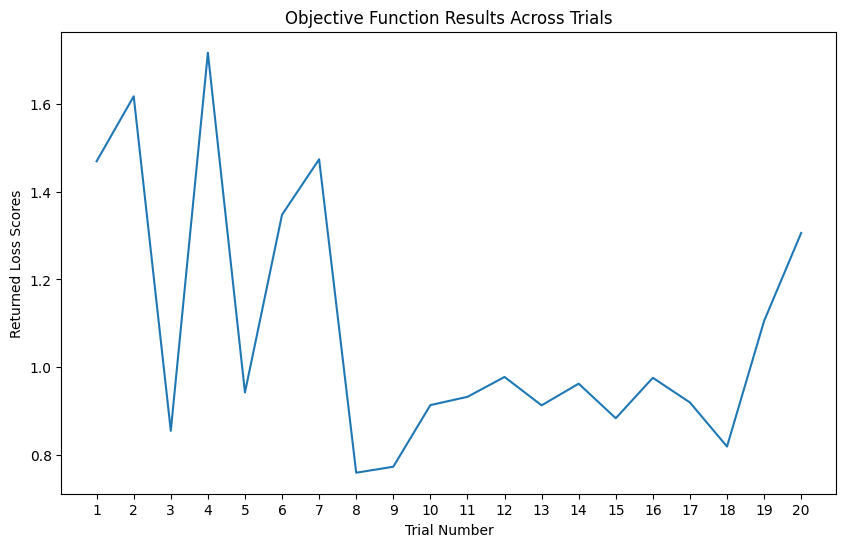

In [ ]:
# Plot the trial history
plt.figure(figsize=(10, 6))
plt.plot(all_trials['number'], all_trials['value'])
plt.xlabel('Trial Number')
plt.ylabel('Returned Loss Scores')
plt.title('Objective Function Results Across Trials')
plt.xticks(range(1, len(all_trials) + 1))
plt.grid(False)
plt.show()

## MealPy

Our next approach for hyperparameter tuning will be using a metaheuristic algorithm. These algorithms can be useful for searching unconventional solution spaces and escaping local optima. They use a high-level strategy or set of rules to arrive at a solution that is likely to be good enough for the current optimization problem. A solid balance of exploration and exploitation is necessary to get the most out of these algorithms. As such, stochastic elements are often incorporated into their methodologies. Some popular metaheursitic algorithms include: genetic algorithms, particle swarm optimization, and simulated annealing.

We will be utilizing the MealPy library's Coronavirus Herd Immunity Optimization algorithm for our task. This algorithm mimics the spread of a virus within a population, where individuals represent potential solutions to the optimization problem. The individuals can be in different states: susceptible, infected, or recovered. These states are relevant to the way that solutions are evaluated and adapted upon in the iterative process.

The CHIO algorithm begins with a set of solutions (a population) initialized. Each solution (individual) is assigned a state. Then the search space exploration commences. The infected individuals explore and then after time, they may recover. The recovered individuals represent local optima, and they are subsequently immune to infection (no longer modified and best solutions are retained). Mutation mechanisms are incorporated to increase solution diversity. Finally, the algorithm terminates after a set number of iterations.

In [ ]:
!pip install mealpy -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.3/386.3 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 79.9 MB/s eta 0:00:00


In [ ]:
import mealpy
from mealpy.human_based import CHIO
from mealpy.utils.space import FloatVar, IntegerVar
from opfunu.type_based.uni_modal import Functions

In [ ]:
import threading

# Global list and lock
solution_scores = []
list_lock = threading.Lock()

# Define the objective function
def objective_function(solution):
    # Extract the hyperparameters from the solution
    n_blocks_stage1, \
    n_blocks_stage2, \
    learning_rate_log, \
    dropout_rate, \
    dense_units, \
    kernel_size_index, \
    stride_index, \
    activation_index, \
    kernel_initializer_index = \
        solution

    # Map index to actual filter values
    filters_options = [[64, 128], [32, 64], [128, 256]]
    filters = filters_options[int(solution[5])]

    # Map indices to actual values
    kernel_size_options = [(3, 3), (5, 5)]
    strides_options = [1, 2]
    activation_options = ['relu', 'leaky_relu', 'gelu']
    kernel_initializer_options = ['he_normal', 'glorot_normal', 'lecun_normal']

    kernel_size = kernel_size_options[int(kernel_size_index)]
    strides = strides_options[int(stride_index)]
    activation = activation_options[int(activation_index)]
    kernel_initializer = kernel_initializer_options[
        int(kernel_initializer_index)
    ]

    # Other conversions
    n_blocks_stage1, n_blocks_stage2, dense_units = \
        map(int, [n_blocks_stage1, n_blocks_stage2, dense_units])
    learning_rate = 10 ** learning_rate_log

    # Build and train the model
    model = DeepCNNModel(
        input_shape,
        num_classes,
         [n_blocks_stage1, n_blocks_stage2],
        filters,
        kernel_size,
        strides,
        activation,
        dropout_rate,
        kernel_initializer,
        dense_units
    )
    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=learning_rate
        ),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    model.fit(train_dataset, epochs=5, verbose=0)

    # Evaluate the model
    loss, accuracy = model.evaluate(val_dataset, verbose=0)

    # Append the score to the list
    with list_lock:
        solution_scores.append(loss)

    return loss

In [ ]:
# Define options for mapping indices to values
kernel_size_options = [(3, 3), (5, 5)]
strides_options = [1, 2]
activation_options = ['relu', 'leaky_relu', 'gelu']
kernel_initializer_options = ['he_normal', 'glorot_normal', 'lecun_normal']

In [ ]:
# Define the problem bounds
problem_bounds = [
    IntegerVar(1, 3),        # n_blocks_stage1
    IntegerVar(1, 3),        # n_blocks_stage2
    FloatVar(-5, 0),         # learning_rate_log
    FloatVar(0.0, 0.5),      # dropout_rate
    IntegerVar(32, 512),     # dense_units
    IntegerVar(0, 1),        # kernel_size_index
    IntegerVar(0, 1),        # stride_index
    IntegerVar(0, 2),        # activation_index
    IntegerVar(0, 2)         # kernel_initializer_index
]

In [ ]:
# Define the problem dictionary
problem_dict = {
    'bounds': problem_bounds,
    'obj_func': objective_function,
    'minmax': 'min',
    'log_to': 'console',
}

In [ ]:
# Set epochs and population size
epoch = 7
pop_size = 5

# Initialize the CHIO algorithm
chio = CHIO.DevCHIO(epoch=epoch, pop_size=pop_size, brr=0.15, max_age=1)

# Run the CHIO algorithm
g_best = chio.solve(problem_dict)

# Print the best solution and its fitness
print(f'Best Parameters: {g_best.solution}')
print(f'Best Loss: {g_best.target.fitness}')

INFO:mealpy.human_based.CHIO.DevCHIO:Solving single objective optimization problem.
INFO:mealpy.human_based.CHIO.DevCHIO:>>>Problem: P, Epoch: 1, Current best: 0.8886523246765137, Global best: 0.8886523246765137, Runtime: 587.10125 seconds
INFO:mealpy.human_based.CHIO.DevCHIO:>>>Problem: P, Epoch: 2, Current best: 0.7319138646125793, Global best: 0.7319138646125793, Runtime: 497.87724 seconds
INFO:mealpy.human_based.CHIO.DevCHIO:>>>Problem: P, Epoch: 3, Current best: 0.8886523246765137, Global best: 0.7319138646125793, Runtime: 583.99018 seconds
INFO:mealpy.human_based.CHIO.DevCHIO:>>>Problem: P, Epoch: 4, Current best: 0.8886523246765137, Global best: 0.7319138646125793, Runtime: 446.10171 seconds
INFO:mealpy.human_based.CHIO.DevCHIO:>>>Problem: P, Epoch: 5, Current best: 0.7991171479225159, Global best: 0.7319138646125793, Runtime: 515.75731 seconds
INFO:mealpy.human_based.CHIO.DevCHIO:>>>Problem: P, Epoch: 6, Current best: 1.036718487739563, Global best: 0.7319138646125793, Runtime:

Best Parameters: [  2.44662134   3.          -2.69751274   0.48788458 270.93752788
   1.           0.           2.           2.        ]
Best Loss: 0.7319138646125793


In [ ]:
# Save the best solution
best_solution = g_best.solution
best_hyperparameters = {
    'n_blocks_stage1': int(best_solution[0]),
    'n_blocks_stage2': int(best_solution[1]),
    'learning_rate': 10 ** best_solution[2],
    'dropout_rate': best_solution[3],
    'dense_units': int(best_solution[4]),
    'kernel_size': kernel_size_options[int(best_solution[5])],
    'strides': strides_options[int(best_solution[6])],
    'activation': activation_options[int(best_solution[7])],
    'kernel_initializer': kernel_initializer_options[int(best_solution[8])]
}

with open('best_hyperparameters.json', 'w') as file:
    json.dump(best_hyperparameters, file, indent=4)

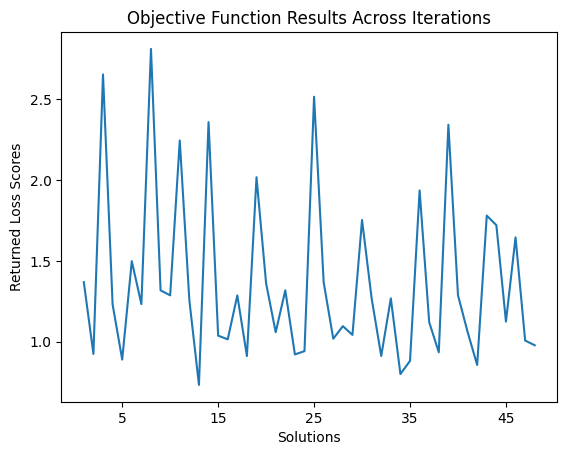

In [ ]:
# Plot the solution history
plt.plot(range(1, len(solution_scores) + 1), solution_scores)
plt.xlabel('Solutions')
plt.ylabel('Returned Loss Scores')
plt.title('Objective Function Results Across Iterations')

# Adjusting the x-ticks to avoid overlapping
plt.xticks(range(5, len(solution_scores) + 1, 10))

plt.grid(False)
plt.show()

# Rebuilding the Model

Now that we have obtained optimized hyperparameter sets from the two approaches, let's rebuild the deep CNN model with each hyperparameter set and compare the results.

## Optuna

In [ ]:
# Convert the 'filters' string back to a list of integers
filters_str = best_params['filters']
filters = [int(f) for f in filters_str.split('_')]

# Convert the 'kernel_size' string back to a tuple
kernel_size_str = best_params['kernel_size']
kernel_size = tuple(map(int, kernel_size_str.split('_')))

In [ ]:
# Rebuild the model with the best hyperparameters
bayesian_model = DeepCNNModel(
    input_shape=input_shape,
    num_classes=num_classes,
    n_blocks=[best_params['n_blocks_stage1'], best_params['n_blocks_stage2']],
    filters=filters,
    kernel_size=kernel_size,
    strides=best_params['strides'],
    activation=best_params['activation'],
    dropout_rate=best_params['dropout_rate'],
    kernel_initializer=best_params['kernel_initializer'],
    dense_units=best_params['dense_units']
)

In [ ]:
# Compile the model
best_learning_rate = best_params['learning_rate']
bayesian_model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=best_learning_rate
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Call the build method
bayesian_model.build(input_shape=[None, *input_shape])

# Model summary
bayesian_model.summary()

Model: "deep_cnn_model_88"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_100 (Conv2D)         multiple                  3584      
                                                                 
 batch_normalization_97 (Ba  multiple                  512       
 tchNormalization)                                               
                                                                 
 activation_95 (Activation)  multiple                  0         
                                                                 
 residual_block_316 (Residu  multiple                  296192    
 alBlock)                                                        
                                                                 
 residual_block_317 (Residu  multiple                  296192    
 alBlock)                                                        
                                                 

In [ ]:
# Fit the model
bayesian_history = bayesian_model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=create_callbacks('bayesian_model')
)

Epoch 1/100
1250/1250 [==============================] - ETA: 0s - loss: 1.4778 - accuracy: 0.4548
Epoch 1: val_loss improved from inf to 2.09215, saving model to ./model_checkpoints/bayesian_model/best_model.tf


1250/1250 [==============================] - 66s 49ms/step - loss: 1.4778 - accuracy: 0.4548 - val_loss: 2.0922 - val_accuracy: 0.3416 - lr: 0.0014
Epoch 2/100
1250/1250 [==============================] - ETA: 0s - loss: 1.0515 - accuracy: 0.6214
Epoch 2: val_loss improved from 2.09215 to 1.57299, saving model to ./model_checkpoints/bayesian_model/best_model.tf


1250/1250 [==============================] - 61s 49ms/step - loss: 1.0515 - accuracy: 0.6214 - val_loss: 1.5730 - val_accuracy: 0.5165 - lr: 0.0014
Epoch 3/100
1249/1250 [============================>.] - ETA: 0s - loss: 0.8774 - accuracy: 0.6867
Epoch 3: val_loss improved from 1.57299 to 1.06079, saving model to ./model_checkpoints/bayesian_model/best_model.tf


1250/1250 [==============================] - 61s 49ms/step - loss: 0.8773 - accuracy: 0.6866 - val_loss: 1.0608 - val_accuracy: 0.6565 - lr: 0.0014
Epoch 4/100
1250/1250 [==============================] - ETA: 0s - loss: 0.7481 - accuracy: 0.7333
Epoch 4: val_loss improved from 1.06079 to 0.79921, saving model to ./model_checkpoints/bayesian_model/best_model.tf


1250/1250 [==============================] - 61s 49ms/step - loss: 0.7481 - accuracy: 0.7333 - val_loss: 0.7992 - val_accuracy: 0.7315 - lr: 0.0014
Epoch 5/100
1250/1250 [==============================] - ETA: 0s - loss: 0.6494 - accuracy: 0.7720
Epoch 5: val_loss did not improve from 0.79921
1250/1250 [==============================] - 58s 46ms/step - loss: 0.6494 - accuracy: 0.7720 - val_loss: 0.8153 - val_accuracy: 0.7345 - lr: 0.0014
Epoch 6/100
1249/1250 [============================>.] - ETA: 0s - loss: 0.5717 - accuracy: 0.8009
Epoch 6: val_loss improved from 0.79921 to 0.76635, saving model to ./model_checkpoints/bayesian_model/best_model.tf


1250/1250 [==============================] - 64s 51ms/step - loss: 0.5717 - accuracy: 0.8009 - val_loss: 0.7664 - val_accuracy: 0.7547 - lr: 0.0014
Epoch 7/100
1249/1250 [============================>.] - ETA: 0s - loss: 0.5121 - accuracy: 0.8232
Epoch 7: val_loss did not improve from 0.76635
1250/1250 [==============================] - 58s 46ms/step - loss: 0.5120 - accuracy: 0.8232 - val_loss: 0.8200 - val_accuracy: 0.7481 - lr: 0.0014
Epoch 8/100
1249/1250 [============================>.] - ETA: 0s - loss: 0.4589 - accuracy: 0.8419
Epoch 8: val_loss did not improve from 0.76635
1250/1250 [==============================] - 58s 46ms/step - loss: 0.4587 - accuracy: 0.8420 - val_loss: 0.9687 - val_accuracy: 0.7290 - lr: 0.0014
Epoch 9/100
1249/1250 [============================>.] - ETA: 0s - loss: 0.4135 - accuracy: 0.8567
Epoch 9: val_loss did not improve from 0.76635

Epoch 9: ReduceLROnPlateau reducing learning rate to 0.00014480220852419734.
1250/1250 [=============================

1250/1250 [==============================] - 61s 49ms/step - loss: 0.2829 - accuracy: 0.9034 - val_loss: 0.4193 - val_accuracy: 0.8639 - lr: 1.4480e-04
Epoch 11/100
1250/1250 [==============================] - ETA: 0s - loss: 0.2512 - accuracy: 0.9129
Epoch 11: val_loss did not improve from 0.41925
1250/1250 [==============================] - 58s 46ms/step - loss: 0.2512 - accuracy: 0.9129 - val_loss: 0.4350 - val_accuracy: 0.8611 - lr: 1.4480e-04
Epoch 12/100
1249/1250 [============================>.] - ETA: 0s - loss: 0.2328 - accuracy: 0.9202
Epoch 12: val_loss did not improve from 0.41925
1250/1250 [==============================] - 58s 46ms/step - loss: 0.2328 - accuracy: 0.9202 - val_loss: 0.4362 - val_accuracy: 0.8634 - lr: 1.4480e-04
Epoch 13/100
1249/1250 [============================>.] - ETA: 0s - loss: 0.2174 - accuracy: 0.9246
Epoch 13: val_loss did not improve from 0.41925

Epoch 13: ReduceLROnPlateau reducing learning rate to 1.4480220852419735e-05.
1250/1250 [==========

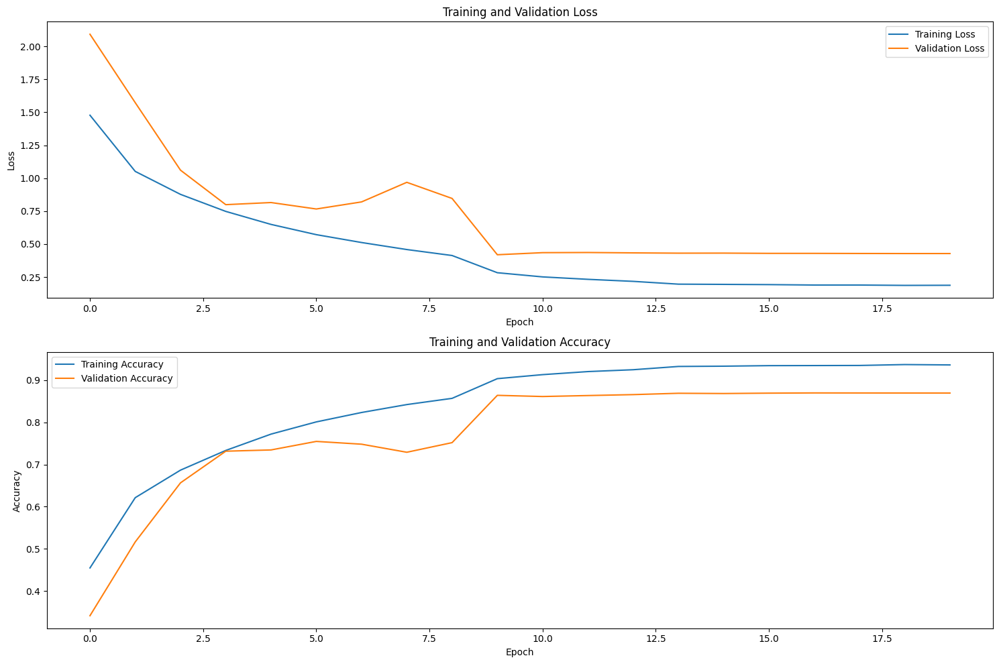

In [ ]:
# Plot the training history
plot_history(bayesian_history)

The model tuned with a Bayesian approach still exhibited the same pattern of early overfitting and plateauing validation performance.

In [ ]:
# Load the best model
best_bayesian = models.load_model('./model_checkpoints/bayesian_model/best_model.tf')

In [ ]:
# Evaluate on the test set
loss_bayesian, accuracy_bayesian = best_bayesian.evaluate(test_dataset)
print(f'Test Loss: {loss_bayesian}, Test Accuracy: {accuracy_bayesian}')

313/313 [==============================] - 4s 11ms/step - loss: 0.4420 - accuracy: 0.8521
Test Loss: 0.4420214295387268, Test Accuracy: 0.8521000146865845


The accuracy score on the test set was 85.2%, which is an approximately 0.9% decrease in performance from the original, deeper CNN model. This suggests that there is a fundamental performance bottleneck in our architecural design, rather than a mere suboptimal choice of hyperparameters. Let's see if the set of hyperparameters chosen by the metaheuristic algorithm can achieve better outcomes.

## MealPy

In [ ]:
# Rebuild the model with the best hyperparameters
chio_model = DeepCNNModel(
    input_shape=input_shape,
    num_classes=num_classes,
    n_blocks=[best_hyperparameters['n_blocks_stage1'],
              best_hyperparameters['n_blocks_stage2']],
    filters=filters,
    kernel_size=best_hyperparameters['kernel_size'],
    strides=best_hyperparameters['strides'],
    activation=best_hyperparameters['activation'],
    dropout_rate=best_hyperparameters['dropout_rate'],
    kernel_initializer=best_hyperparameters['kernel_initializer'],
    dense_units=best_hyperparameters['dense_units']
)

In [ ]:
# Compile the model
chio_learning_rate = best_hyperparameters['learning_rate']
chio_model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=chio_learning_rate
    ),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# Call the build method
chio_model.build(input_shape=[None, *input_shape])

# Model summary
chio_model.summary()

Model: "deep_cnn_model_89"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_101 (Conv2D)         multiple                  9728      
                                                                 
 batch_normalization_98 (Ba  multiple                  512       
 tchNormalization)                                               
                                                                 
 activation_96 (Activation)  multiple                  0         
                                                                 
 residual_block_319 (Residu  multiple                  820480    
 alBlock)                                                        
                                                                 
 residual_block_320 (Residu  multiple                  820480    
 alBlock)                                                        
                                                 

In [ ]:
# Fit the model
chio_history = chio_model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=create_callbacks('chio_model')
)

Epoch 1/100
1250/1250 [==============================] - ETA: 0s - loss: 1.6094 - accuracy: 0.4020
Epoch 1: val_loss improved from inf to 1.46791, saving model to ./model_checkpoints/chio_model/best_model.tf


1250/1250 [==============================] - 173s 133ms/step - loss: 1.6094 - accuracy: 0.4020 - val_loss: 1.4679 - val_accuracy: 0.4592 - lr: 0.0020
Epoch 2/100
1250/1250 [==============================] - ETA: 0s - loss: 1.1117 - accuracy: 0.5994
Epoch 2: val_loss improved from 1.46791 to 1.34128, saving model to ./model_checkpoints/chio_model/best_model.tf


1250/1250 [==============================] - 166s 132ms/step - loss: 1.1117 - accuracy: 0.5994 - val_loss: 1.3413 - val_accuracy: 0.5095 - lr: 0.0020
Epoch 3/100
1250/1250 [==============================] - ETA: 0s - loss: 0.8601 - accuracy: 0.6977
Epoch 3: val_loss improved from 1.34128 to 1.10398, saving model to ./model_checkpoints/chio_model/best_model.tf


1250/1250 [==============================] - 165s 132ms/step - loss: 0.8601 - accuracy: 0.6977 - val_loss: 1.1040 - val_accuracy: 0.6278 - lr: 0.0020
Epoch 4/100
1250/1250 [==============================] - ETA: 0s - loss: 0.6956 - accuracy: 0.7588
Epoch 4: val_loss improved from 1.10398 to 0.84691, saving model to ./model_checkpoints/chio_model/best_model.tf


1250/1250 [==============================] - 165s 132ms/step - loss: 0.6956 - accuracy: 0.7588 - val_loss: 0.8469 - val_accuracy: 0.7210 - lr: 0.0020
Epoch 5/100
1250/1250 [==============================] - ETA: 0s - loss: 0.5821 - accuracy: 0.7988
Epoch 5: val_loss did not improve from 0.84691
1250/1250 [==============================] - 160s 128ms/step - loss: 0.5821 - accuracy: 0.7988 - val_loss: 0.8599 - val_accuracy: 0.7134 - lr: 0.0020
Epoch 6/100
1250/1250 [==============================] - ETA: 0s - loss: 0.4920 - accuracy: 0.8305
Epoch 6: val_loss did not improve from 0.84691
1250/1250 [==============================] - 161s 128ms/step - loss: 0.4920 - accuracy: 0.8305 - val_loss: 0.9251 - val_accuracy: 0.6987 - lr: 0.0020
Epoch 7/100
1250/1250 [==============================] - ETA: 0s - loss: 0.4119 - accuracy: 0.8581
Epoch 7: val_loss did not improve from 0.84691

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.00020067221485078337.
1250/1250 [=======================

1250/1250 [==============================] - 168s 135ms/step - loss: 0.2604 - accuracy: 0.9106 - val_loss: 0.4206 - val_accuracy: 0.8645 - lr: 2.0067e-04
Epoch 9/100
1250/1250 [==============================] - ETA: 0s - loss: 0.2141 - accuracy: 0.9285
Epoch 9: val_loss did not improve from 0.42060
1250/1250 [==============================] - 160s 128ms/step - loss: 0.2141 - accuracy: 0.9285 - val_loss: 0.4264 - val_accuracy: 0.8643 - lr: 2.0067e-04
Epoch 10/100
1250/1250 [==============================] - ETA: 0s - loss: 0.1839 - accuracy: 0.9380
Epoch 10: val_loss did not improve from 0.42060
1250/1250 [==============================] - 161s 128ms/step - loss: 0.1839 - accuracy: 0.9380 - val_loss: 0.4344 - val_accuracy: 0.8641 - lr: 2.0067e-04
Epoch 11/100
1250/1250 [==============================] - ETA: 0s - loss: 0.1632 - accuracy: 0.9453
Epoch 11: val_loss did not improve from 0.42060

Epoch 11: ReduceLROnPlateau reducing learning rate to 2.0067222067154944e-05.
1250/1250 [======

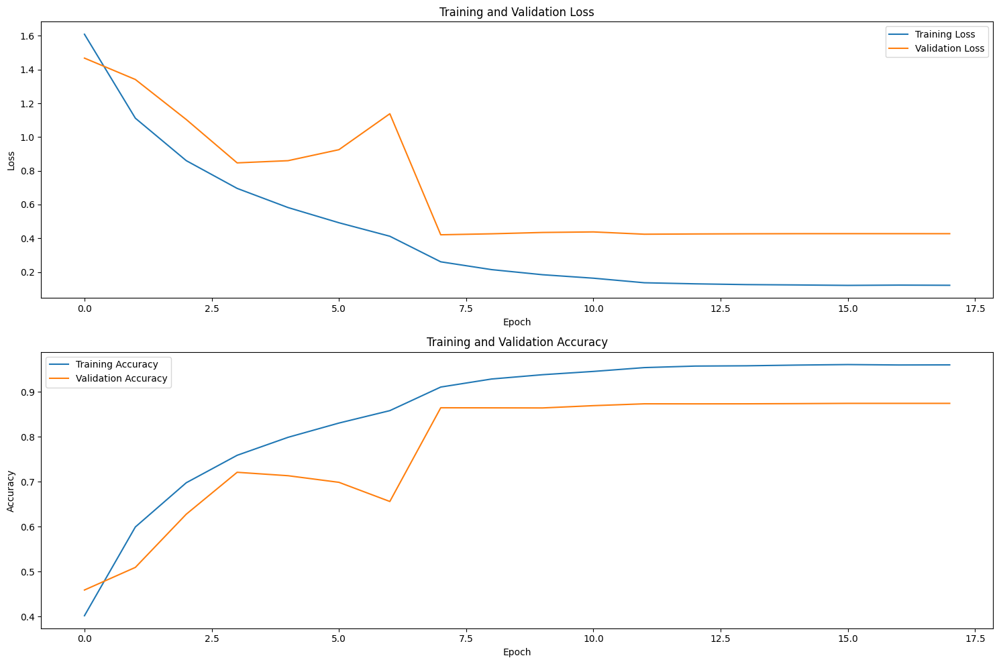

In [ ]:
# Plot the training history
plot_history(chio_history)

Again, the same early overfitting behavior can be observed here.

In [ ]:
# Load the best model
best_chio = models.load_model('./model_checkpoints/chio_model/best_model.tf')

In [ ]:
# Evaluate on the test set
loss_chio, accuracy_chio = best_chio.evaluate(test_dataset)
print(f'Test Loss: {loss_chio}, Test Accuracy: {accuracy_chio}')

313/313 [==============================] - 8s 26ms/step - loss: 0.4462 - accuracy: 0.8560
Test Loss: 0.4461575746536255, Test Accuracy: 0.8560000061988831


A test set accuracy score of 85.6% indicates that the CHIO-tuned model performed slightly better than the Optuna-tuned model, but also slightly worse than the original, deeper CNN model. Our hyperparameter tuning workflow has suggested that if we wish to obtain higher levels of performance on this task, we will need to revisit the model architecture and make significant adjustments. Perhaps the model would benefit from even greater depth, from greater regularization to combat the consistent overfitting we observed, or from a higher number of stacked convolutional layers prior to the application of regularization, normalization, or residual connections. For now, we will select the original, deeper CNN model as our best model moving forward.

# Additional Evaluation

As part of our evaluation, let's examine the confusion matrix resulting from our selected model's performance. This will provide deeper insight into the types of errors made by our model.

In [ ]:
from sklearn.metrics import confusion_matrix

# Initialize an empty list to store all predictions
all_predictions = []

# Iterate over the test dataset and collect all predictions
for X, _ in test_dataset:
    batch_predictions = best_deeper.predict(X)
    all_predictions.append(batch_predictions)

# Concatenate all predictions
all_predictions = np.concatenate(all_predictions, axis=0)

# Convert predictions to class labels
predicted_classes = np.argmax(all_predictions, axis=1)

# Extract true labels and reshape
true_labels = np.concatenate([y for _, y in test_dataset], axis=0).reshape(-1)

# Print the shapes
print(true_labels.shape)
print(predicted_classes.shape)

1/1 [==============================] - 0s 204ms/step
(10000,)
(10000,)


In [ ]:
# Create the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_classes)

# Print the confusion matrix
print('Confusion Matrix:')
print(conf_matrix)

Confusion Matrix:
[[886   6  31  12   7   1   4   9  26  18]
 [ 10 928   3   7   1   1   2   2   8  38]
 [ 34   0 796  55  45  23  29  14   3   1]
 [ 15   0  39 772  28  99  19  16  10   2]
 [  3   1  34  47 850  16  15  29   5   0]
 [  6   1  20 136  21 785  10  19   1   1]
 [  5   3  37  50  17  12 865   5   4   2]
 [  7   0  14  27  26  32   1 892   0   1]
 [ 33   7   3   9   3   0   3   3 931   8]
 [ 22  35   4   9   1   1   1   3  15 909]]


Let's re-create this confusion matrix with Plotly and then interpret it.

In [ ]:
import plotly.express as px

# Unique labels in the dataset
unique_labels = np.unique(np.concatenate([predicted_classes, true_labels]))

# Create confusion matrix with Plotly
fig = px.imshow(
    conf_matrix,
    labels=dict(x='Predicted Label', y='True Label', color='Count'),
    x=unique_labels,
    y=unique_labels,
    text_auto=True,
    color_continuous_scale='Blues'
)

# Update x-axis and y-axis ticks
fig.update_xaxes(tickvals=list(range(10)), ticktext=[str(i) for i in range(10)])
fig.update_yaxes(tickvals=list(range(10)), ticktext=[str(i) for i in range(10)])

# Update title, font, and margin
fig.update_layout(
    title='<b>Confusion Matrix</b>',
    font=dict(family='Arial, sans-serif', size=12, color='DarkSlateGrey'),
    template='plotly_white',
    margin=dict(l=60, r=60, t=60, b=60)
)
fig.show()

The rows in the confusion matrix represent the actual classes and the columns represent the predicted classes. The diagonal cells show the number of correct predictions for each class. We can see that the model had a particularly difficult time classifying classes 3 (cats) and 5 (dogs). It misclassified cats as dogs and dogs as cats. However, the model misclassified dogs as cats more frequently than it misclassified cats as dogs. Correctly identifying classes 1 (cars) and 8 (ships) were the easiest tasks for our model.

Matthew's correlation coefficient is a metric that measures the correlation between the observed and predicted classifications. It is typically used in the context of binary classification and imbalanced datasets, but it can be extended to multiclass classification problems, and we will use it here to evaluate the model. Scikit-learn has an implementation that can generalize the MCC to multiclass classification tasks.

In [ ]:
from sklearn.metrics import matthews_corrcoef

# Print Matthew's correlation coefficient
mcc = matthews_corrcoef(true_labels, predicted_classes)
print(f'Matthews Correlation Coefficient: {mcc}')

Matthews Correlation Coefficient: 0.8460964322854124


A score of 1 indicates perfect agreement between predictions and observations, and a score of -1 indicates total disagreement. A score of 0.846 suggests that our model has strong predictive power, with a good balance of true positives, true negatives, false positives, and false negatives.

# Prediction Examination

Lastly, we will examine a batch of predictions to see firsthand how our model is classifying the samples.

1/1 [==============================] - 0s 20ms/step


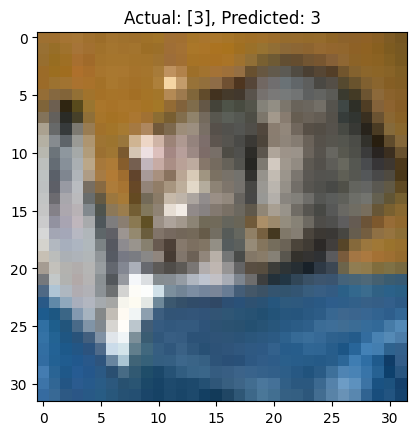

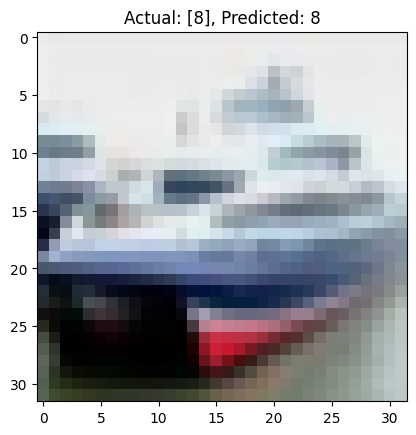

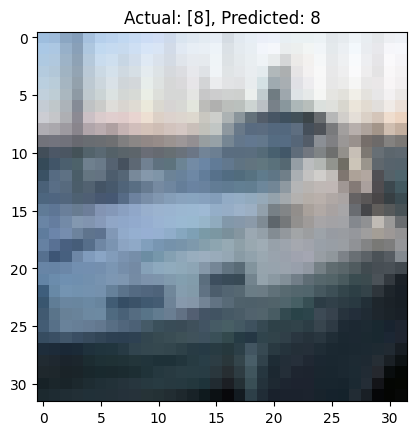

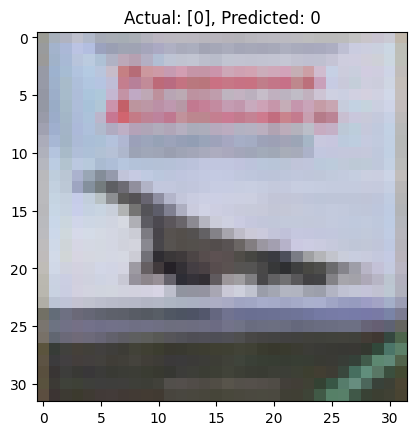

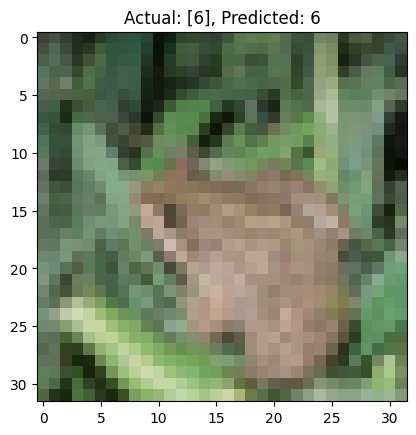

...

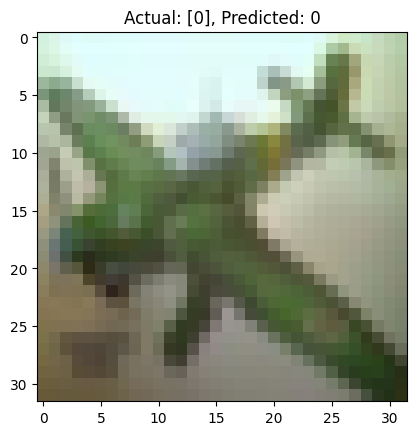

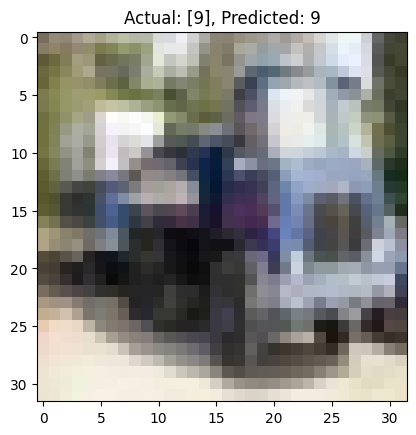

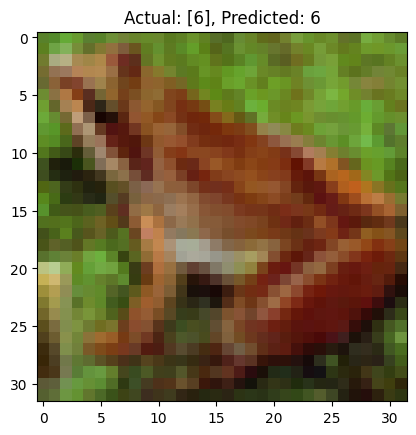

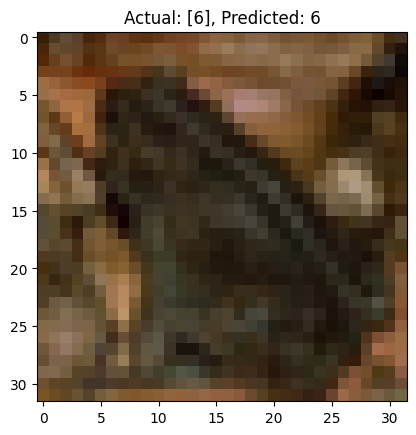

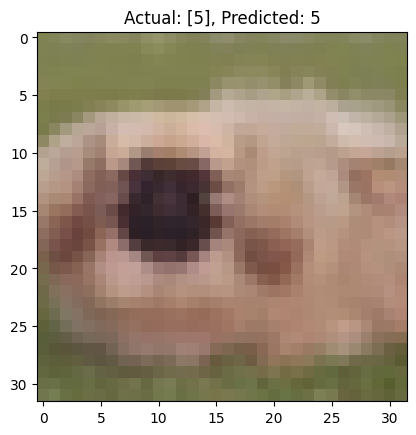

In [ ]:
# Take samples from the test dataset
test_samples = test_dataset.take(1)

# Predict and compare with actual labels
for images, labels in test_samples:
    predictions = best_deeper.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)

    for i in range(len(images)):
        plt.imshow(images[i])
        plt.title(f'Actual: {labels[i]}, Predicted: {predicted_classes[i]}')
        plt.show()